In [2]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
import numpy as np
from math import log
import matplotlib.pyplot as plt
import cv2
import os
import time

# Adaboost Algorithm

# Size x Size of data
window_size = 20

# Type      7 types based on haar shape
# Feature   cv2 of feature type
# Start     starting pixel of feature on image
# Size      ratio for increased size of feature
# Shape     original shape of feature
class Haar(object):
    def __init__(self, type, feature, size, shape, start):
        self.type = type
        self.feature = cv2.resize(feature, (shape[1]*size, shape[0]*size), interpolation=cv2.INTER_NEAREST)
        self.start = start
        self.size = size
        self.shape = shape


# Haar      associated haar object
# Theta     optimal threshold for classifier
# Sign      polarity of classifier, used in prediction
# Weight    Not used
class WeakClassifier(object):
    def __init__(self, haar, theta, sign, weight):
        self.haar = haar
        self.theta = theta
        self.sign = sign
        self.weight = weight


def blockSum(integral, w, h, w_kernel_size, h_kernel_size):
    w = int(w)
    h = int(h)
    w_kernel_size = int(w_kernel_size)
    h_kernel_size = int(h_kernel_size)
    endw = w + w_kernel_size - 1
    endh = h + h_kernel_size - 1
    sum = integral[endh, endw]
    if w > 0:
        sum -= integral[endh, w - 1]
    if h > 0:
        sum -= integral[h - 1, endw]
    if h > 0 and w > 0:
        sum += integral[h - 1, w - 1]
    return sum


def subwindow_integral(subwindow):
    integral = np.zeros(subwindow.shape)

    for r in range(subwindow.shape[0]):
        for c in range(subwindow.shape[1]):
            greyIntegralVal = subwindow[r, c]

            if r - 1 >= 0 and c - 1 >= 0:
                greyIntegralVal -= integral[r-1, c-1]

            if r - 1 >= 0:
                greyIntegralVal += integral[r-1, c]

            if c - 1 >= 0:
                greyIntegralVal += integral[r, c-1]

            integral[r, c] = greyIntegralVal

    return integral


def get_haar_score_fast(haar, subwindow, subwindow_integral):
    r = haar.start[0]
    c = haar.start[1]
    size_w = haar.feature.shape[1]
    size_h = haar.feature.shape[0]

    if size_w == 2 and size_h == 2:
        # Simple feature, not using integral
        if haar.type == 1:
            return subwindow[r, c]+subwindow[r+1, c]-subwindow[r, c+1]-subwindow[r+1, c+1]
        elif haar.type == 2:
            return subwindow[r, c]+subwindow[r, c+1]-subwindow[r+1, c]-subwindow[r+1, c+1]
        elif haar.type == 5:
            return subwindow[r, c]+subwindow[r+1, c+1]-subwindow[r, c+1]-subwindow[r+1, c]
        elif haar.type == 6:
            return subwindow[r+1, c]+subwindow[r, c+1]-subwindow[r, c]-subwindow[r+1, c+1]
    else:
        # More complex features, using integral to reduce array references
        if haar.type == 1:
            return blockSum(subwindow_integral, c, r, size_w / 2, size_h) - blockSum(subwindow_integral, c + (size_w / 2), r, size_w / 2, size_h)
        elif haar.type == 2:
            return blockSum(subwindow_integral, c, r, size_w, size_h / 2) - blockSum(subwindow_integral, c, r + (size_h / 2), size_w, size_h / 2)
        elif haar.type == 3:
            return blockSum(subwindow_integral, c, r, size_w, size_h) - 2 * blockSum(subwindow_integral, c + (size_w / 3), r, size_w / 3, size_h)
        elif haar.type == 4:
            return blockSum(subwindow_integral, c, r, size_w, size_h) - 2 * blockSum(subwindow_integral, c, r + (size_h / 3), size_w, size_h / 3)
        elif haar.type == 5:
            return blockSum(subwindow_integral, c, r, size_w, size_h) - 2 * (blockSum(subwindow_integral, c + (size_w / 2), r, size_w / 2, size_h / 2) + blockSum(subwindow_integral, c, r + (size_h / 2), size_w / 2, size_h / 2))
        elif haar.type == 6:
            return blockSum(subwindow_integral, c, r, size_w, size_h) - 2 * (blockSum(subwindow_integral, c, r, size_w / 2, size_h / 2) + blockSum(subwindow_integral, c + (size_w / 2), r + (size_h / 2), size_w / 2, size_h / 2))
        elif haar.type == 7:
            if size_w == 3:
                return blockSum(subwindow_integral, c, r, size_w, size_h) - 2 * subwindow[r + 1, c + 1]
            else:
                return blockSum(subwindow_integral, c, r, size_w, size_h) - 2 * blockSum(subwindow_integral, c + (size_w / 3), r + (size_h / 3), size_w / 3, size_h / 3)


def feature_weighted_error_rate(actual, predicted, weights):
    return sum(weights*(np.not_equal(actual, predicted)))


def predict(score, classifier):
    if score < classifier.theta:
        return -classifier.sign
    return classifier.sign

def get_samples(path):
    samples = []
    for file in os.listdir(path):
        samples.append(cv2.imread(path + file, cv2.IMREAD_GRAYSCALE))
    return samples


def plot_haar(haar, title):
    plt.style.use('grayscale')
    plt.axis('off')
    plt.title(title)
    plt.imshow(haar, interpolation='nearest')
    plt.show()


In [5]:
# Generate positive samples
positive_samples = get_samples("/content/drive/My Drive/school/Machine Learning/ECE 763/positive_samples/")

# Generate Negative samples
negative_samples = get_samples("/content/drive/My Drive/school/Machine Learning/ECE 763/negative_samples/")

negative_samples_rotated = [np.rot90(np.rot90(np.rot90(el))) for el in negative_samples]
negative_samples = negative_samples + negative_samples_rotated

# Shuffle all the samples
np.random.shuffle(positive_samples)
np.random.shuffle(negative_samples)

print("Total samples: ")
print("Positives: " + str(len(positive_samples)))
print("Negatives: " + str(len(negative_samples)))

split = 0.90
pos_split = int(len(positive_samples)*split)
neg_split = int(len(negative_samples)*split)

training_set = positive_samples[0:pos_split] + negative_samples[0:neg_split]
testing_set = positive_samples[pos_split:] + negative_samples[neg_split:]

training_integrals = [subwindow_integral(el) for el in training_set]
testing_integrals = [subwindow_integral(el) for el in testing_set]

training_set_pos = pos_split
training_set_neg = neg_split

testing_set_pos = len(positive_samples) - training_set_pos
testing_set_neg = len(negative_samples) - training_set_neg

training_labels = [1] * training_set_pos + [-1] * training_set_neg
testing_labels = [1] * testing_set_pos + [-1] * testing_set_neg

print("For training")
print("Positives: " + str(training_set_pos))
print("Negatives: " + str(training_set_neg))

print("For testing")
print("Positives: " + str(testing_set_pos))
print("Negatives: " + str(testing_set_neg))

print("Testing training split: " + str(split))

Total samples: 
Positives: 1110
Negatives: 2200
For training
Positives: 999
Negatives: 1980
For testing
Positives: 111
Negatives: 220
Testing training split: 0.9


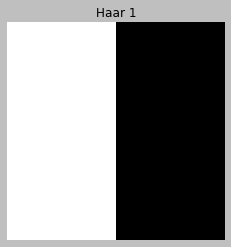

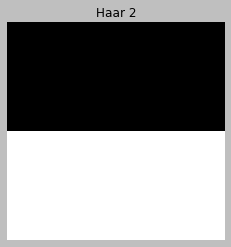

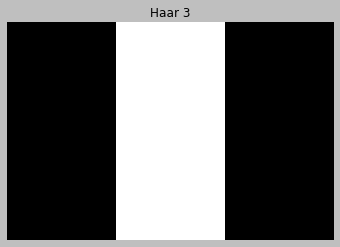

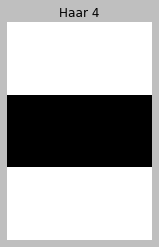

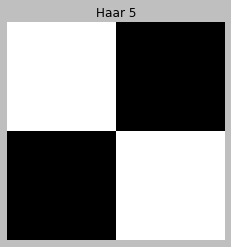

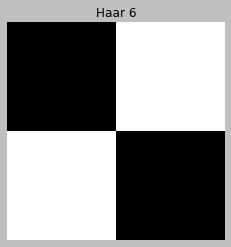

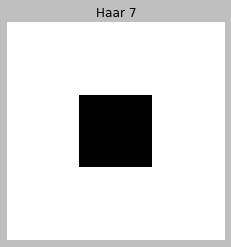

In [6]:
# Generate many haar features
features_start = []

# Define haar feature types
haar1 = np.array([1, -1,
                  1, -1])
haar1.shape = (2, 2)

haar2 = np.array([-1, -1,
                  1, 1])
haar2.shape = (2, 2)

haar3 = np.array([-1, 1, -1,
                  -1, 1, -1])
haar3.shape = (2, 3)

haar4 = np.array([1, 1,
                  -1, -1,
                  1, 1])
haar4.shape = (3, 2)

haar5 = np.array([1, -1,
                  -1, 1])
haar5.shape = (2, 2)

haar6 = np.array([-1, 1,
                  1, -1])
haar6.shape = (2, 2)

haar7 = np.array([1, 1, 1,
                  1, -1, 1,
                  1, 1, 1])
haar7.shape = (3, 3)

haar_feature_types = [haar1, haar2, haar3, haar4, haar5, haar6, haar7]

# Plot in matlib the haar features
for f in range(len(haar_feature_types)):
    plot_haar(haar_feature_types[f], 'Haar ' + str(f+1))

# Define many sizes for all feature types
for f in range(len(haar_feature_types)):
    shape = haar_feature_types[f].shape
    if 3 in haar_feature_types[f].shape:
        max_size = 4
    else:
        max_size = 7

    # Generate features for different haar sizes
    for s in range(1, max_size+1):
        features_start.append(Haar(f+1, haar_feature_types[f], s, shape, (0,0)))

In [7]:
features = []

# Populate feature vector with all possible starting locations and sizes
for j in features_start:
    starting_positions = []
    space = (window_size-j.shape[0]*j.size, window_size-j.shape[1]*j.size)
    for m in range(space[0]+1):
        for n in range(space[1]+1):
            starting_positions.append((m, n))

    for location in starting_positions:
        features.append(Haar(j.type, j.feature, j.size, j.shape, location))

features = list(features)

feature_weights = []

np.random.shuffle(features)

scores = []
polarities = []
errors = []
thetas = []

# For each feature, get scores and polarity and optimal threshold
for j in features:
    print('Feature ' + str(features.index(j)+1) + ' out of: ' + str(len(features)))
    avgPosScore = 0.0
    avgNegScore = 0.0

    # Apply feature to every training sample and get average score for feature
    for i in range(len(training_set)):
        score = get_haar_score_fast(j, training_set[i], training_integrals[i])
        scores.append(score)

        if training_labels[i] == 1:
            avgPosScore += score
        else:
            avgNegScore += score

    avgPosScore = avgPosScore / training_set_pos
    avgNegScore = avgNegScore / training_set_neg
    if avgPosScore > avgNegScore:
        polarity = 1
    else:
        polarity = -1
    polarities.append(polarity)

    # Optimal theta found
    theta = (avgPosScore + avgNegScore) / 2
    thetas.append(theta)

Feature 1 out of: 7742
Feature 2 out of: 7742
Feature 3 out of: 7742
Feature 4 out of: 7742
Feature 5 out of: 7742
Feature 6 out of: 7742
Feature 7 out of: 7742
Feature 8 out of: 7742
Feature 9 out of: 7742
Feature 10 out of: 7742
Feature 11 out of: 7742
Feature 12 out of: 7742
Feature 13 out of: 7742


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars


Streaming output truncated to the last 5000 lines.
Feature 2744 out of: 7742
Feature 2745 out of: 7742
Feature 2746 out of: 7742
Feature 2747 out of: 7742
Feature 2748 out of: 7742
Feature 2749 out of: 7742
Feature 2750 out of: 7742
Feature 2751 out of: 7742
Feature 2752 out of: 7742
Feature 2753 out of: 7742
Feature 2754 out of: 7742
Feature 2755 out of: 7742
Feature 2756 out of: 7742
Feature 2757 out of: 7742
Feature 2758 out of: 7742
Feature 2759 out of: 7742
Feature 2760 out of: 7742
Feature 2761 out of: 7742
Feature 2762 out of: 7742
Feature 2763 out of: 7742
Feature 2764 out of: 7742
Feature 2765 out of: 7742
Feature 2766 out of: 7742
Feature 2767 out of: 7742
Feature 2768 out of: 7742
Feature 2769 out of: 7742
Feature 2770 out of: 7742
Feature 2771 out of: 7742
Feature 2772 out of: 7742
Feature 2773 out of: 7742
Feature 2774 out of: 7742
Feature 2775 out of: 7742
Feature 2776 out of: 7742
Feature 2777 out of: 7742
Feature 2778 out of: 7742
Feature 2779 out of: 7742
Feature 2780 

 
Best feature index: 1403/7742


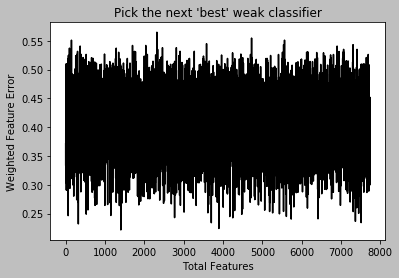

f_i: 0.22166939666939667
TP, TN, FP, FN for the current weak classifier:
0.7117117117117117 0.8449494949494949 0.15505050505050505 0.2882882882882883
Threshold: -214.43212303212303
Classification error: 0.19973145350788854


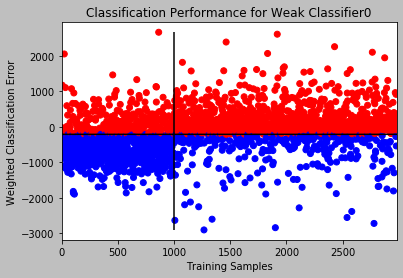

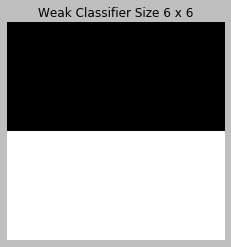

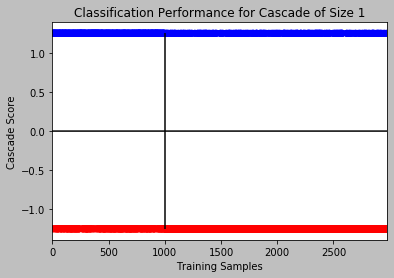

F_i: 0.22166939666939667
Cascade size: 1
 
Best feature index: 5962/7742


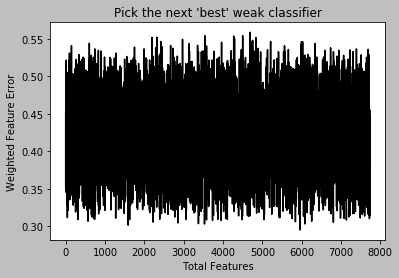

f_i: 0.3014150514150514
TP, TN, FP, FN for the current weak classifier:
0.7557557557557557 0.6414141414141414 0.35858585858585856 0.24424424424424424
Threshold: 965.6000591500592
Classification error: 0.3202416918429003


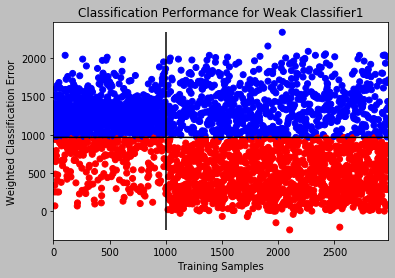

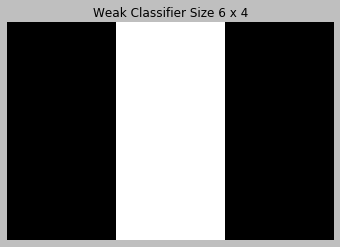

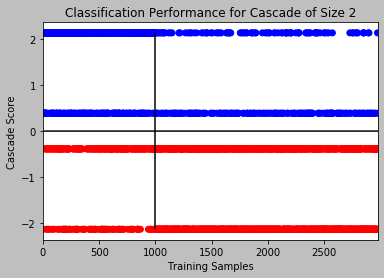

F_i: 0.22166939666939667
Cascade size: 2
 
Best feature index: 4478/7742


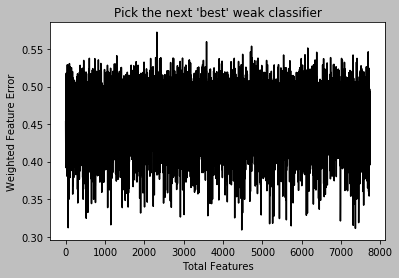

f_i: 0.24868959868959867
TP, TN, FP, FN for the current weak classifier:
0.7117117117117117 0.7909090909090909 0.20909090909090908 0.2882882882882883
Threshold: -345.64822094822097
Classification error: 0.23564954682779457


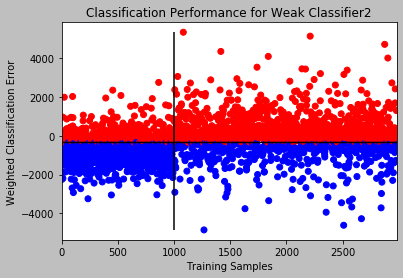

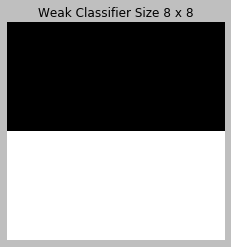

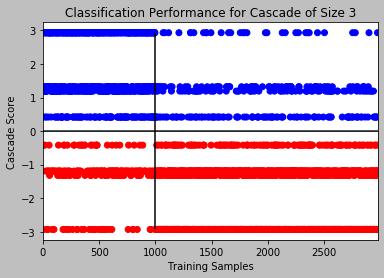

F_i: 0.1762990262990263
Cascade size: 3
 
Best feature index: 1588/7742


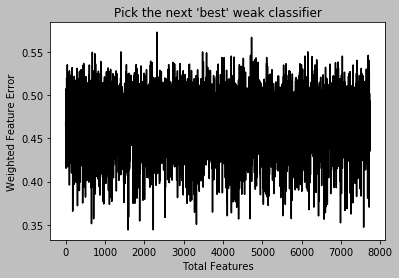

f_i: 0.287030212030212
TP, TN, FP, FN for the current weak classifier:
0.6466466466466466 0.7792929292929293 0.2207070707070707 0.3533533533533533
Threshold: 141.53395895895898
Classification error: 0.2651896609600537


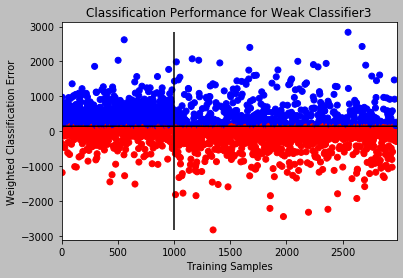

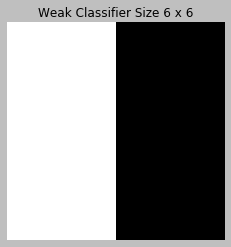

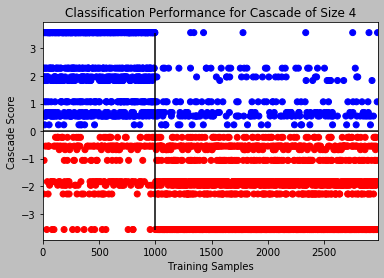

F_i: 0.17394439894439895
Cascade size: 4
 
Best feature index: 3326/7742


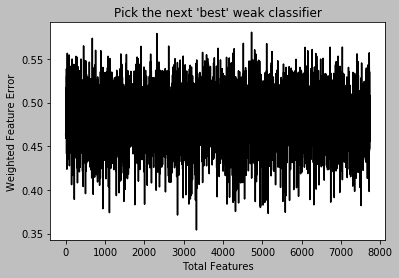

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars


f_i: 0.35989625989625995
TP, TN, FP, FN for the current weak classifier:
0.7327327327327328 0.5474747474747474 0.45252525252525255 0.2672672672672673
Threshold: 144.7970060970061
Classification error: 0.39039946290701577


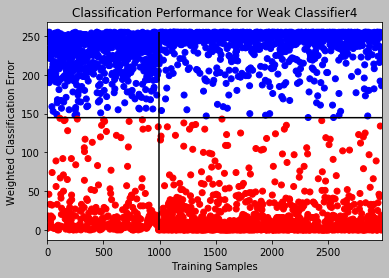

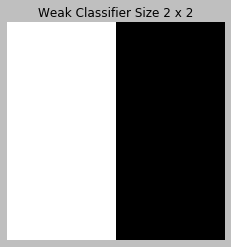

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars


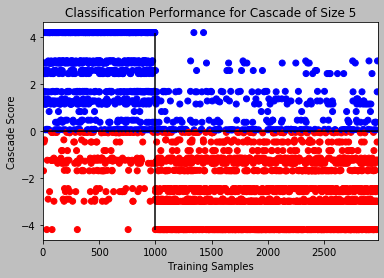

F_i: 0.17106879606879608
Cascade size: 5
 
Best feature index: 5150/7742


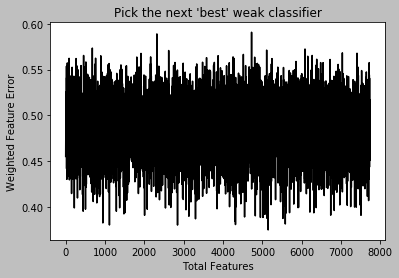

f_i: 0.37317317317317317
TP, TN, FP, FN for the current weak classifier:
0.5425425425425425 0.7111111111111111 0.28888888888888886 0.4574574574574575
Threshold: 30.556697606697607
Classification error: 0.34541792547834843


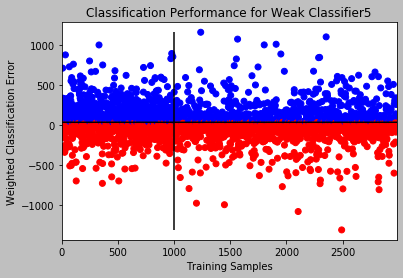

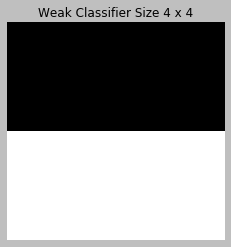

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars


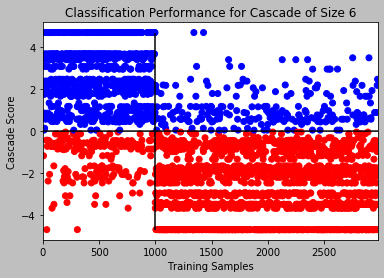

F_i: 0.16144553644553644
Cascade size: 6
 
Best feature index: 5139/7742


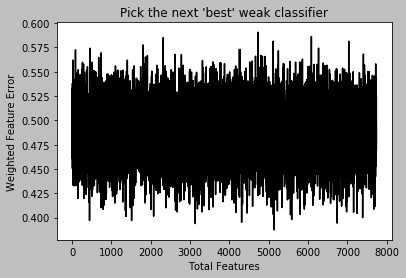

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars


f_i: 0.39352761852761853
TP, TN, FP, FN for the current weak classifier:
0.7427427427427428 0.4702020202020202 0.5297979797979798 0.25725725725725723
Threshold: 95.61482163982164
Classification error: 0.4384021483719369


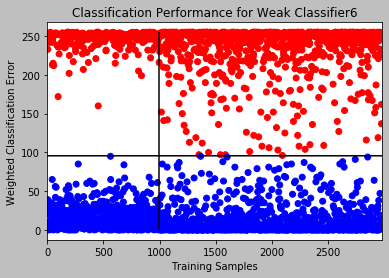

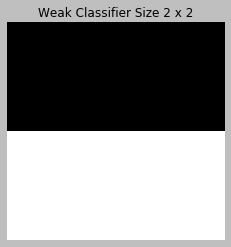

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars


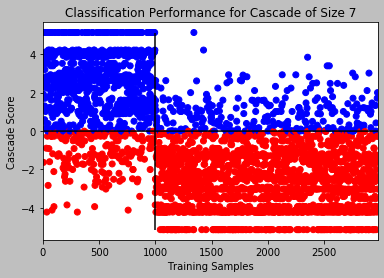

F_i: 0.16003048503048503
Cascade size: 7
 
Best feature index: 3134/7742


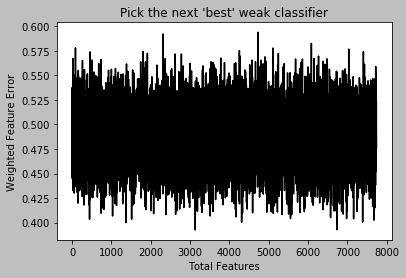

f_i: 0.32982300482300486
TP, TN, FP, FN for the current weak classifier:
0.6166166166166166 0.7237373737373738 0.27626262626262627 0.3833833833833834
Threshold: 262.58552643552645
Classification error: 0.3121852970795569


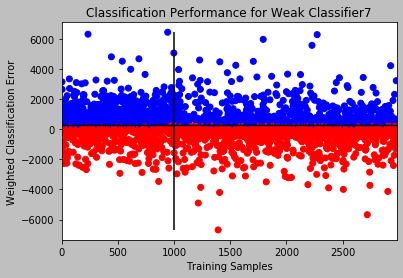

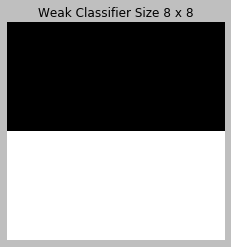

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars


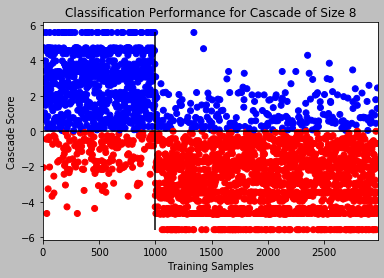

F_i: 0.14142551642551643
Cascade size: 8
 
Best feature index: 6575/7742


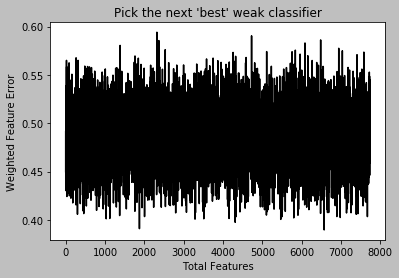

f_i: 0.317990717990718
TP, TN, FP, FN for the current weak classifier:
0.6246246246246246 0.7393939393939394 0.2606060606060606 0.37537537537537535
Threshold: 30.15955500955501
Classification error: 0.2990936555891239


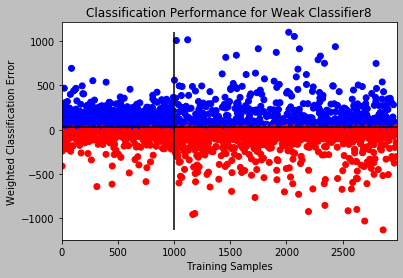

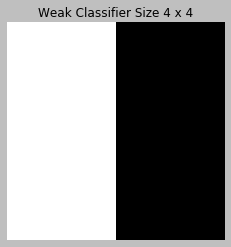

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars


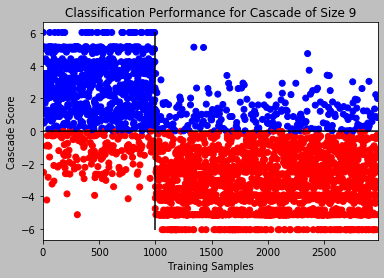

F_i: 0.14718809718809717
Cascade size: 9
 
Best feature index: 6983/7742


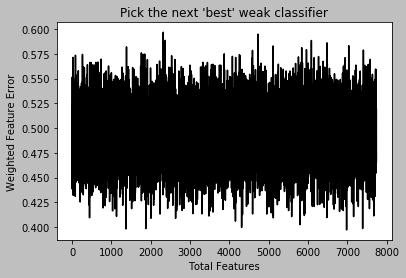

f_i: 0.4219196469196469
TP, TN, FP, FN for the current weak classifier:
0.5445445445445446 0.6116161616161616 0.3883838383838384 0.45545545545545546
Threshold: -32.21263081263081
Classification error: 0.4108761329305136


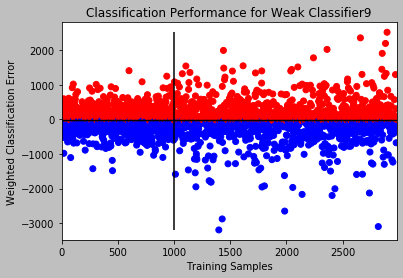

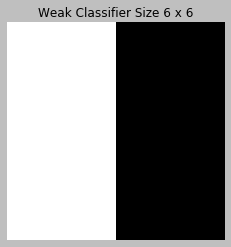

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars


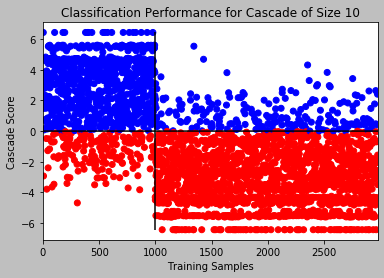

F_i: 0.13838156338156338
Cascade size: 10
 
Best feature index: 5067/7742


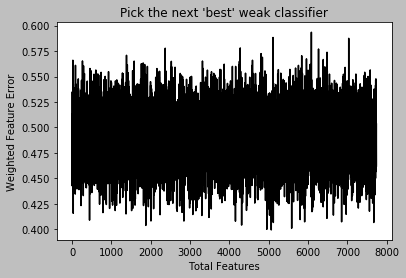

f_i: 0.3446036946036946
TP, TN, FP, FN for the current weak classifier:
0.5905905905905906 0.7202020202020202 0.2797979797979798 0.4094094094094094
Threshold: 31.745936845936846
Classification error: 0.32326283987915405


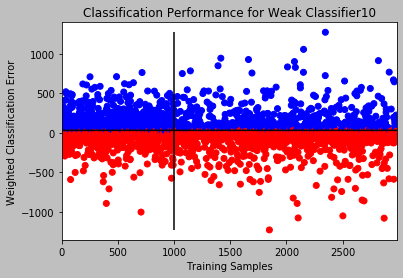

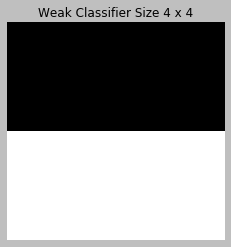

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars


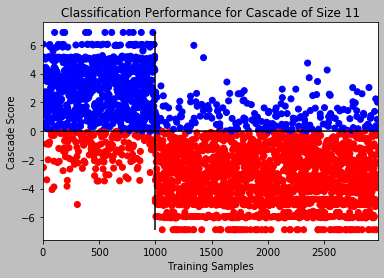

F_i: 0.13963508963508964
Cascade size: 11
 
Best feature index: 3483/7742


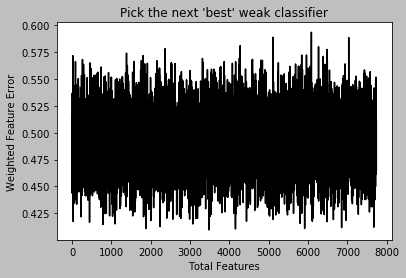

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars


f_i: 0.4201951951951952
TP, TN, FP, FN for the current weak classifier:
0.7207207207207207 0.4388888888888889 0.5611111111111111 0.27927927927927926
Threshold: 94.53179998179999
Classification error: 0.4665995300436388


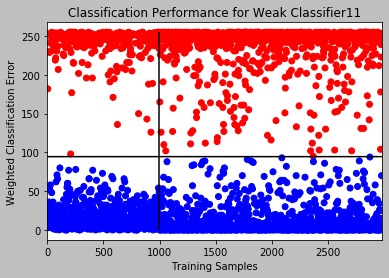

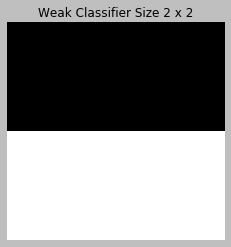

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars


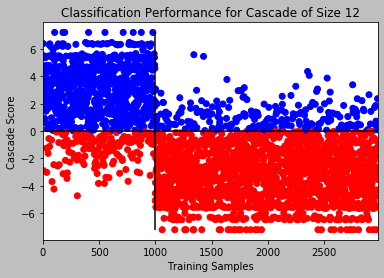

F_i: 0.13388160888160888
Cascade size: 12
 
Best feature index: 1876/7742


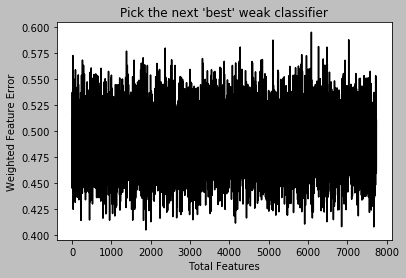

f_i: 0.33018700518700517
TP, TN, FP, FN for the current weak classifier:
0.5855855855855856 0.7540404040404041 0.24595959595959596 0.4144144144144144
Threshold: -40.90595595595595
Classification error: 0.30245048674051694


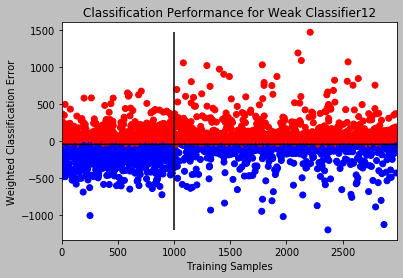

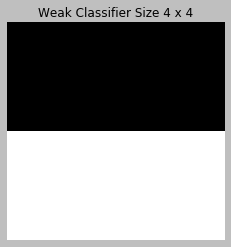

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars


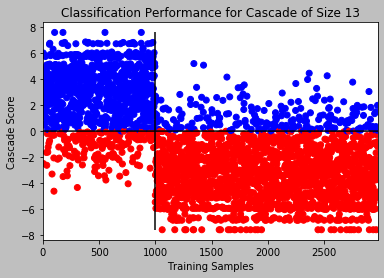

F_i: 0.14063609063609064
Cascade size: 13
 
Best feature index: 445/7742


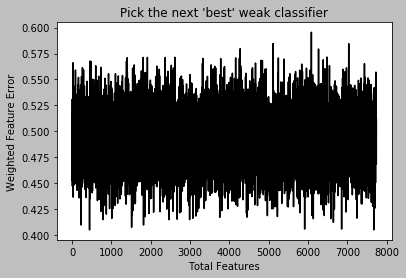

f_i: 0.32391482391482396
TP, TN, FP, FN for the current weak classifier:
0.5945945945945946 0.7575757575757576 0.24242424242424243 0.40540540540540543
Threshold: -46.305198380198384
Classification error: 0.297079556898288


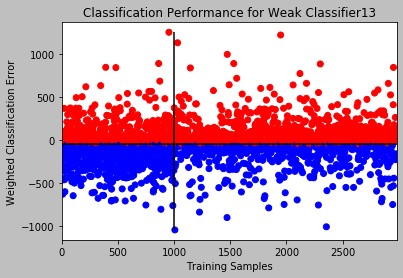

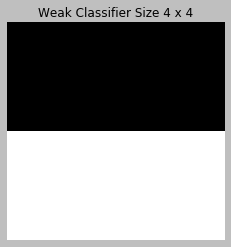

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars


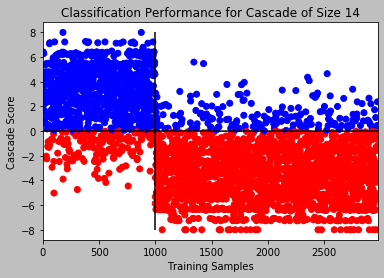

F_i: 0.12755937755937755
Cascade size: 14
 
Best feature index: 228/7742


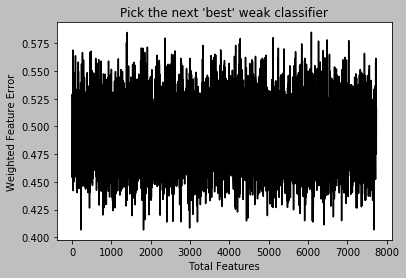

f_i: 0.4506301756301756
TP, TN, FP, FN for the current weak classifier:
0.5275275275275275 0.5712121212121212 0.4287878787878788 0.4724724724724725
Threshold: -18.725375375375375
Classification error: 0.4434373950990265


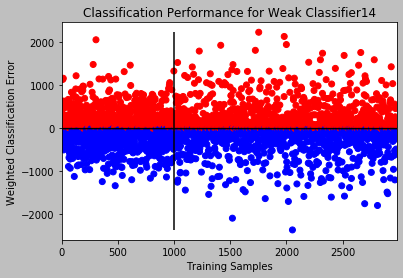

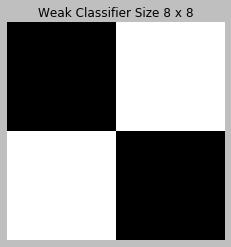

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars


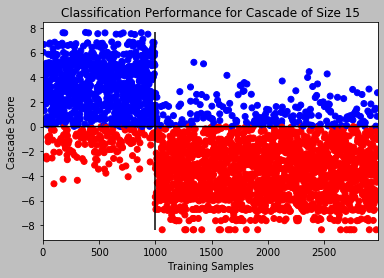

F_i: 0.12507962507962508
Cascade size: 15
 
Best feature index: 6414/7742


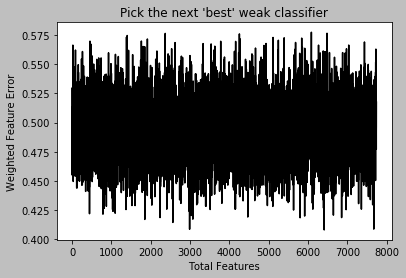

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars


f_i: 0.40247975247975243
TP, TN, FP, FN for the current weak classifier:
0.6566566566566566 0.5383838383838384 0.4616161616161616 0.3433433433433433
Threshold: 140.57978205478207
Classification error: 0.4219536757301108


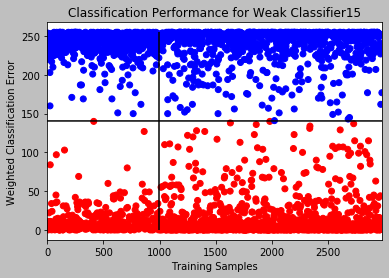

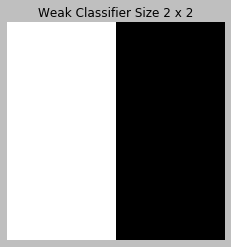

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars


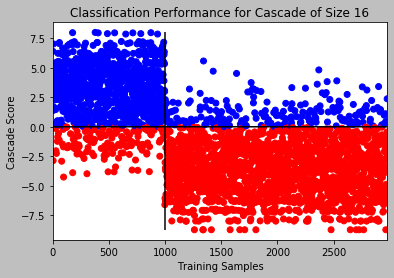

F_i: 0.1245927745927746
Cascade size: 16
 
Best feature index: 7674/7742


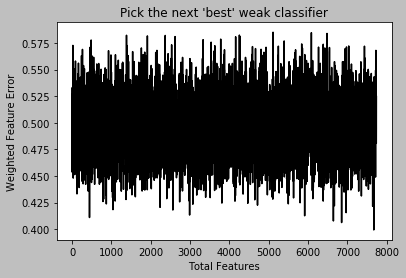

f_i: 0.40506870506870507
TP, TN, FP, FN for the current weak classifier:
0.5595595595595596 0.6303030303030303 0.3696969696969697 0.44044044044044045
Threshold: 30.780002730002728
Classification error: 0.3934206109432696


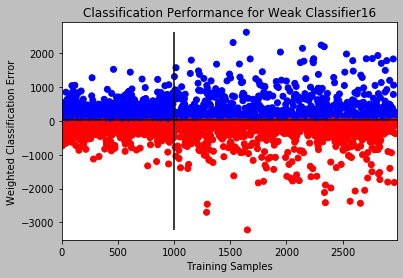

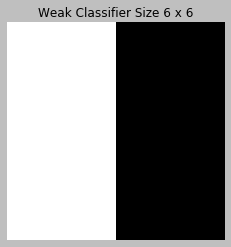

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars


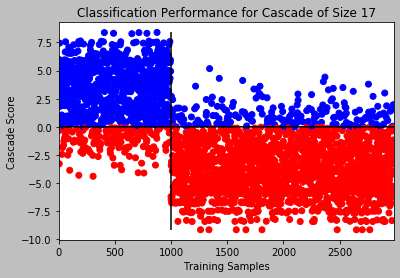

F_i: 0.12631950131950131
Cascade size: 17
 
Best feature index: 786/7742


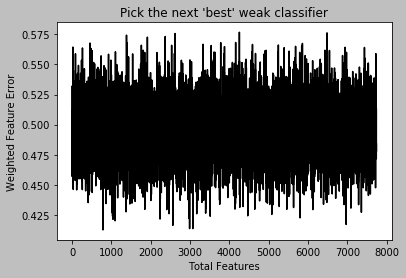

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars


f_i: 0.4098416598416598
TP, TN, FP, FN for the current weak classifier:
0.6096096096096096 0.5707070707070707 0.4292929292929293 0.39039039039039036
Threshold: 130.65965965965967
Classification error: 0.41624706277274254


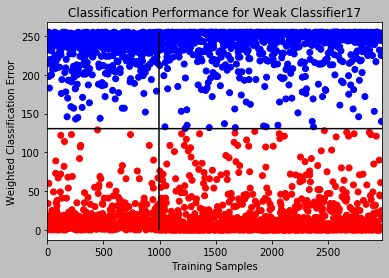

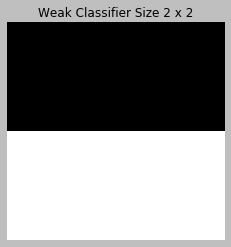

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars


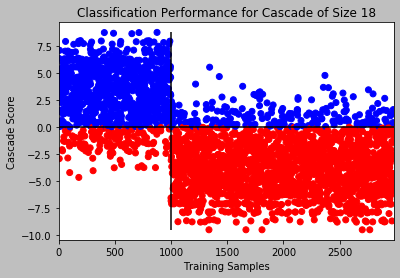

F_i: 0.12133724633724634
Cascade size: 18
 
Best feature index: 2990/7742


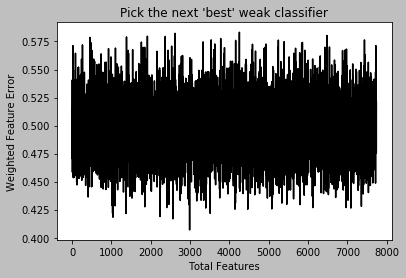

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars


f_i: 0.3638866138866139
TP, TN, FP, FN for the current weak classifier:
0.7217217217217218 0.5505050505050505 0.4494949494949495 0.2782782782782783
Threshold: 145.469721994722
Classification error: 0.3920778784827123


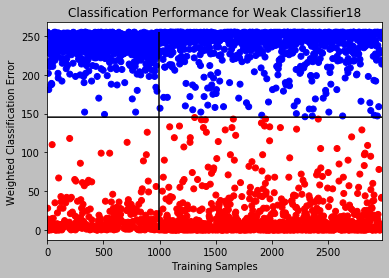

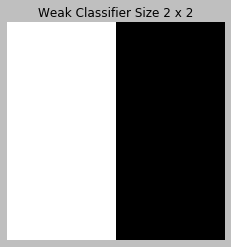

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars


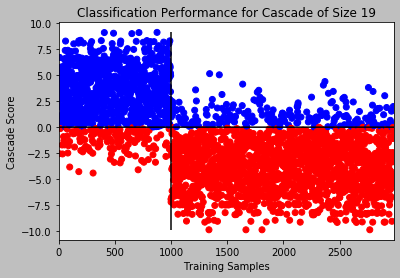

F_i: 0.11884384384384383
Cascade size: 19
 
Best feature index: 2564/7742


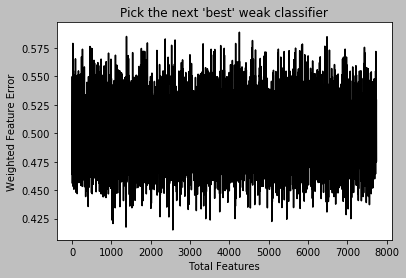

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars


f_i: 0.46411638911638914
TP, TN, FP, FN for the current weak classifier:
0.4944944944944945 0.5772727272727273 0.42272727272727273 0.5055055055055055
Threshold: 117.48957821457822
Classification error: 0.450486740516952


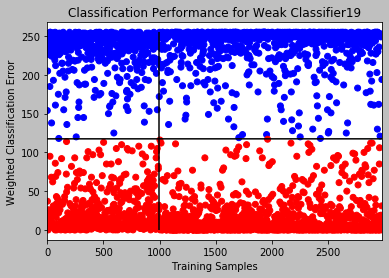

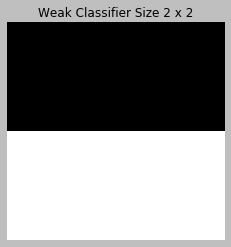

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars


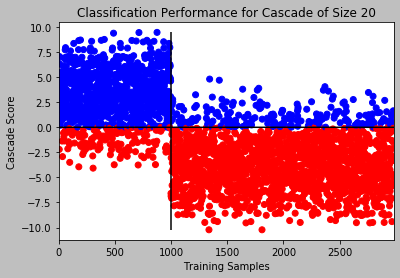

F_i: 0.1200882700882701
Cascade size: 20
 
Best feature index: 1041/7742


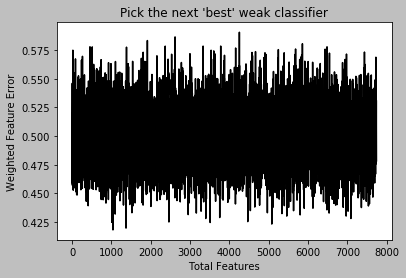

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars


f_i: 0.4374670124670125
TP, TN, FP, FN for the current weak classifier:
0.5205205205205206 0.6045454545454545 0.39545454545454545 0.4794794794794795
Threshold: 116.4314155064155
Classification error: 0.4236320913058073


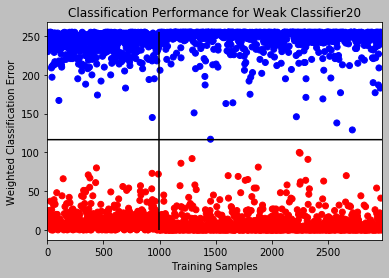

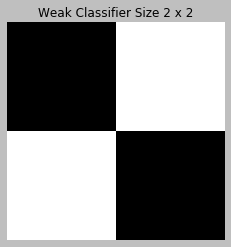

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars


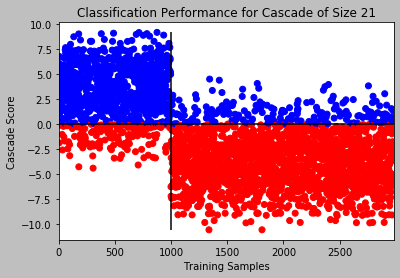

F_i: 0.1183069433069433
Cascade size: 21
 
Best feature index: 1373/7742


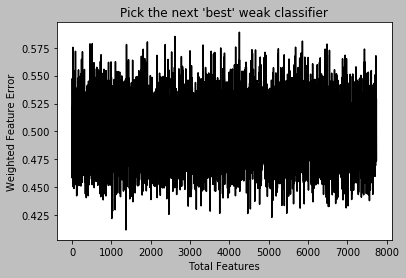

f_i: 0.39263126763126766
TP, TN, FP, FN for the current weak classifier:
0.5455455455455456 0.6691919191919192 0.33080808080808083 0.4544544544544545
Threshold: -18.11923286923287
Classification error: 0.3722725746894931


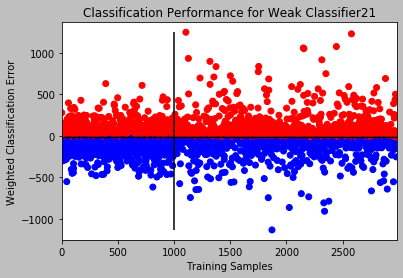

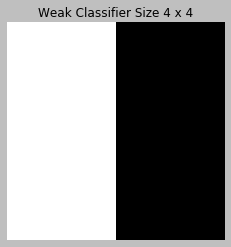

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars


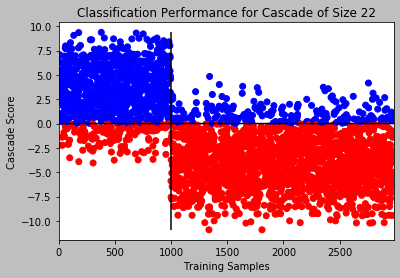

F_i: 0.11755391755391756
Cascade size: 22
 
Best feature index: 5080/7742


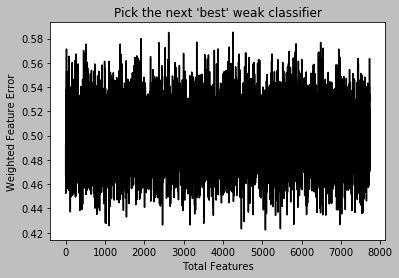

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


f_i: 0.4505164255164255
TP, TN, FP, FN for the current weak classifier:
0.5025025025025025 0.5964646464646465 0.4035353535353535 0.4974974974974975
Threshold: 116.0060515060515
Classification error: 0.4350453172205438


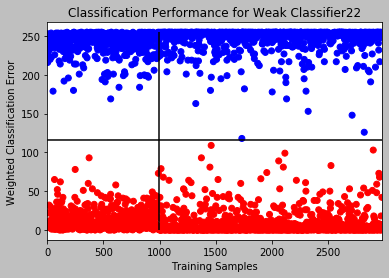

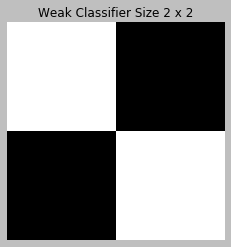

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


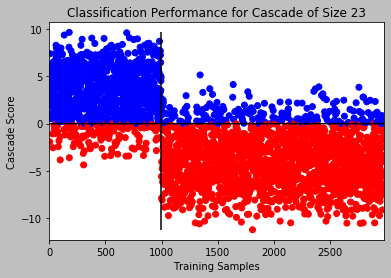

F_i: 0.1173013923013923
Cascade size: 23
 
Best feature index: 4469/7742


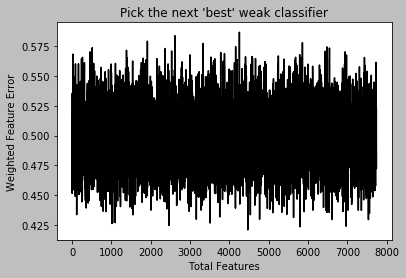

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars


f_i: 0.44914232414232413
TP, TN, FP, FN for the current weak classifier:
0.6446446446446447 0.45707070707070707 0.5429292929292929 0.35535535535535534
Threshold: 104.2351465101465
Classification error: 0.48002685464921113


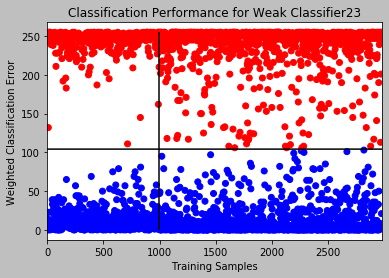

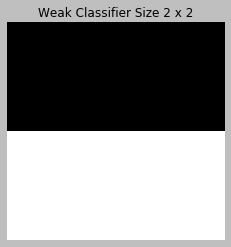

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


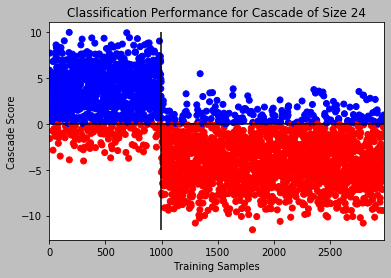

F_i: 0.11632314132314131
Cascade size: 24
 
Best feature index: 1010/7742


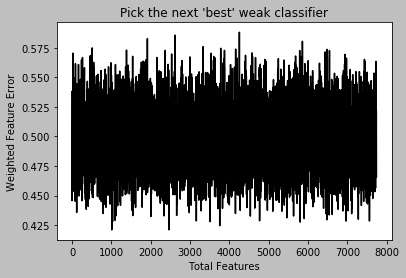

f_i: 0.3347552097552098
TP, TN, FP, FN for the current weak classifier:
0.5905905905905906 0.73989898989899 0.2601010101010101 0.4094094094094094
Threshold: -28.839441714441715
Classification error: 0.31017119838872104


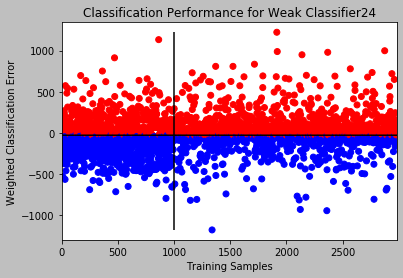

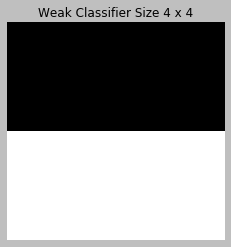

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


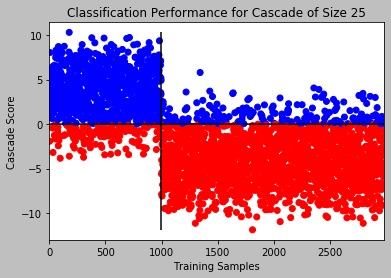

F_i: 0.11377513877513878
Cascade size: 25
 
Best feature index: 1031/7742


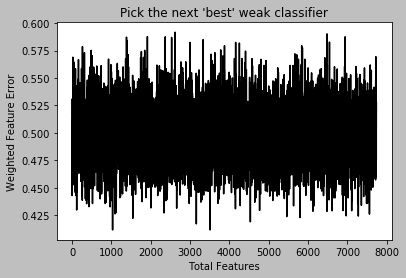

f_i: 0.3897624897624898
TP, TN, FP, FN for the current weak classifier:
0.5255255255255256 0.694949494949495 0.30505050505050507 0.4744744744744745
Threshold: 8.14481526981527
Classification error: 0.36186639812017457


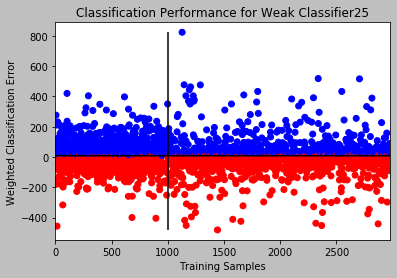

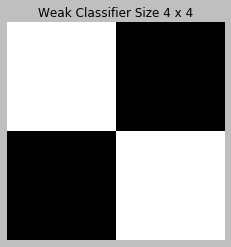

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


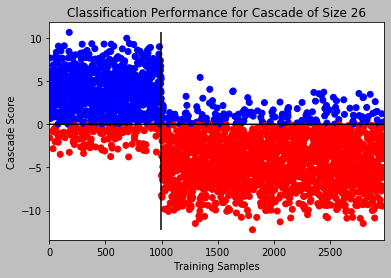

F_i: 0.10950950950950952
Cascade size: 26
 
Best feature index: 6971/7742


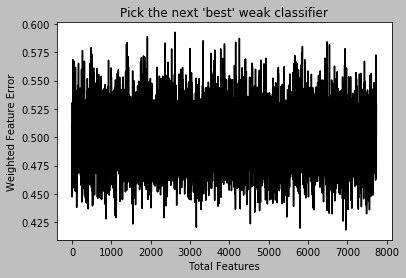

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars


f_i: 0.4284466284466285
TP, TN, FP, FN for the current weak classifier:
0.7027027027027027 0.4404040404040404 0.5595959595959596 0.2972972972972973
Threshold: 96.93170215670216
Classification error: 0.47163477677072846


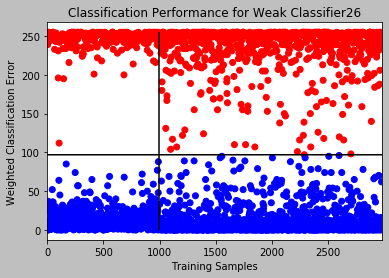

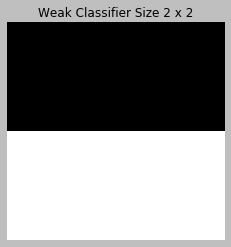

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


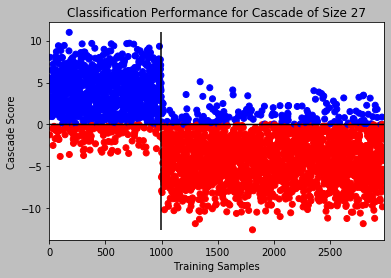

F_i: 0.10974838474838475
Cascade size: 27
 
Best feature index: 1112/7742


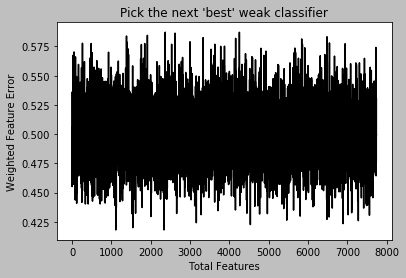

f_i: 0.37876967876967876
TP, TN, FP, FN for the current weak classifier:
0.5515515515515516 0.6909090909090909 0.3090909090909091 0.44844844844844844
Threshold: 28.30550323050323
Classification error: 0.355824102047667


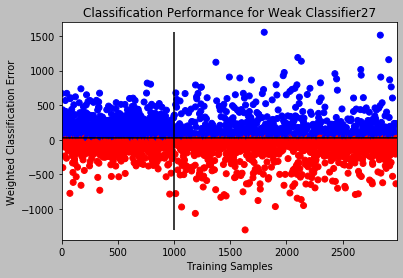

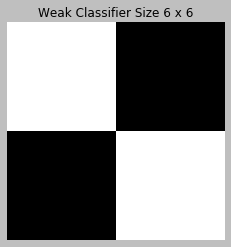

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


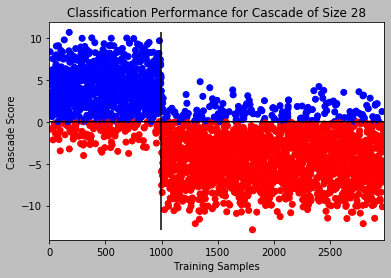

F_i: 0.10674083174083174
Cascade size: 28
 
Best feature index: 3282/7742


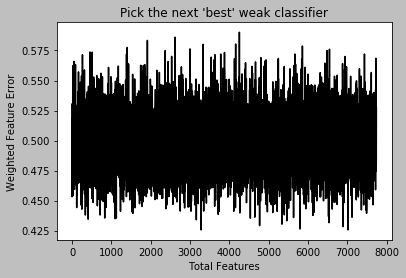

f_i: 0.42428564928564927
TP, TN, FP, FN for the current weak classifier:
0.5095095095095095 0.6419191919191919 0.35808080808080806 0.4904904904904905
Threshold: 4.390053690053691
Classification error: 0.4024840550520309


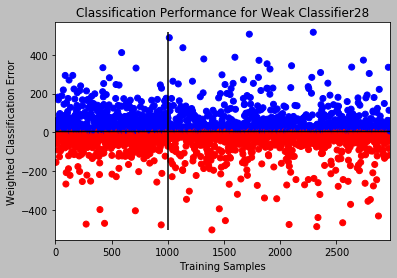

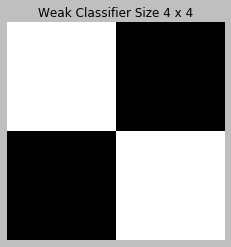

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


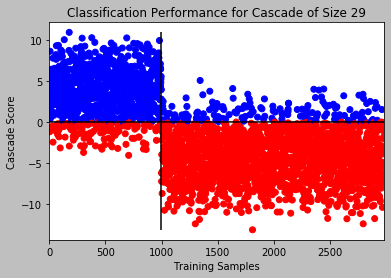

F_i: 0.10672263172263172
Cascade size: 29
 
Best feature index: 5801/7742


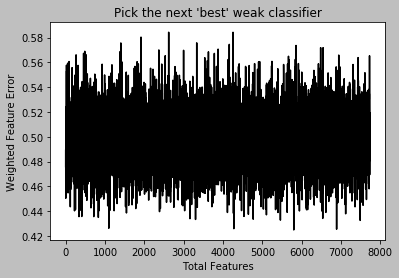

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars


f_i: 0.41493766493766493
TP, TN, FP, FN for the current weak classifier:
0.7307307307307307 0.4393939393939394 0.5606060606060606 0.26926926926926925
Threshold: 92.79845527345526
Classification error: 0.4629070157771064


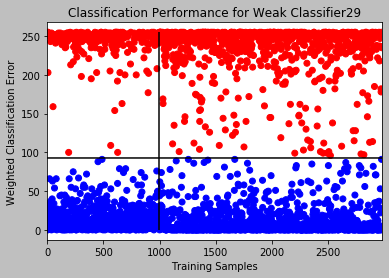

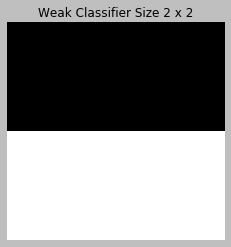

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


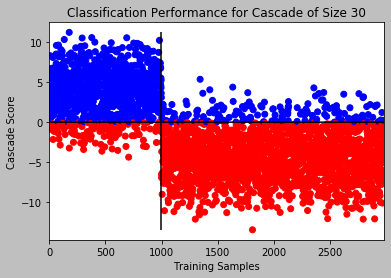

F_i: 0.10475247975247975
Cascade size: 30
 
Best feature index: 4277/7742


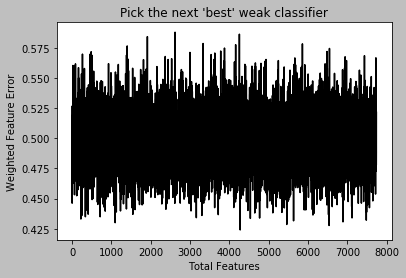

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars


f_i: 0.43415460915460913
TP, TN, FP, FN for the current weak classifier:
0.5695695695695696 0.5621212121212121 0.43787878787878787 0.43043043043043044
Threshold: 128.16018291018293
Classification error: 0.4353810003356831


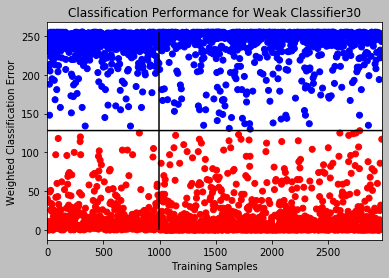

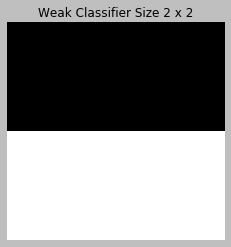

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


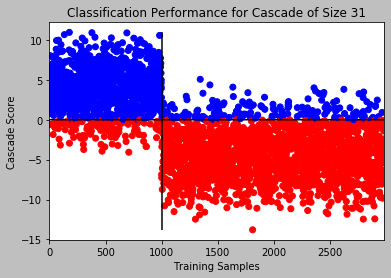

F_i: 0.10551005551005552
Cascade size: 31
 
Best feature index: 5338/7742


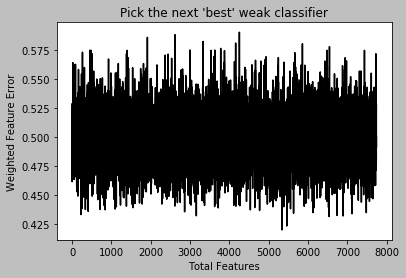

f_i: 0.3500910000910001
TP, TN, FP, FN for the current weak classifier:
0.5755755755755756 0.7242424242424242 0.27575757575757576 0.4244244244244244
Threshold: 212.95943670943672
Classification error: 0.3256126216851292


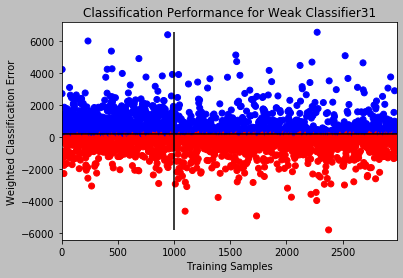

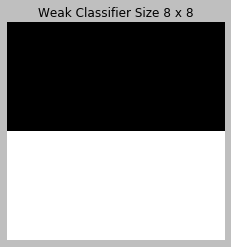

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


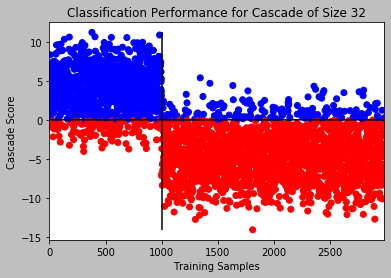

F_i: 0.10424742924742925
Cascade size: 32
 
Best feature index: 5461/7742


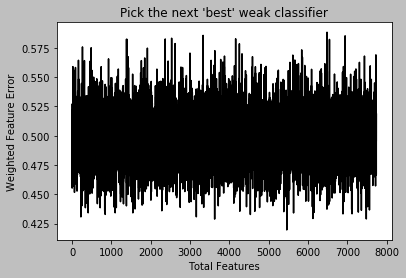

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars


f_i: 0.46338156338156344
TP, TN, FP, FN for the current weak classifier:
0.4994994994994995 0.5737373737373738 0.4262626262626263 0.5005005005005005
Threshold: 117.87975475475474
Classification error: 0.4511581067472306


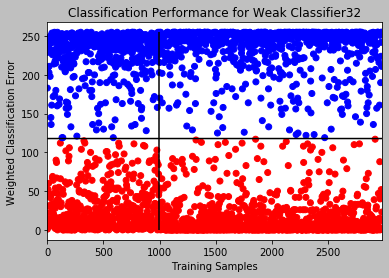

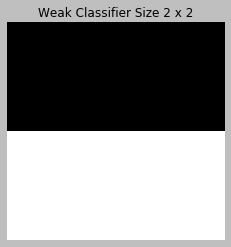

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


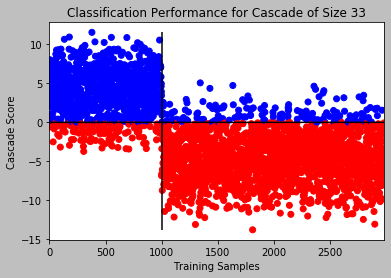

F_i: 0.09972472472472473
Cascade size: 33
 
Best feature index: 6154/7742


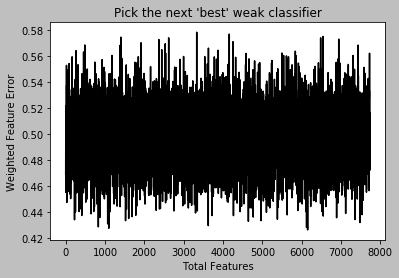

f_i: 0.4143575393575394
TP, TN, FP, FN for the current weak classifier:
0.5475475475475475 0.6237373737373737 0.37626262626262624 0.45245245245245247
Threshold: 25.48268495768496
Classification error: 0.40181268882175225


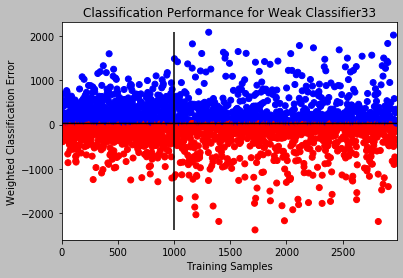

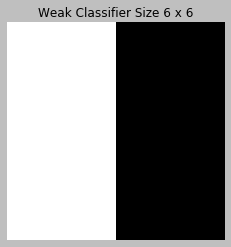

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


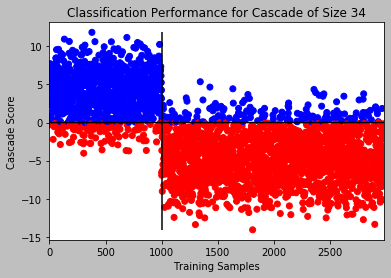

F_i: 0.09697424697424697
Cascade size: 34
 
Best feature index: 831/7742


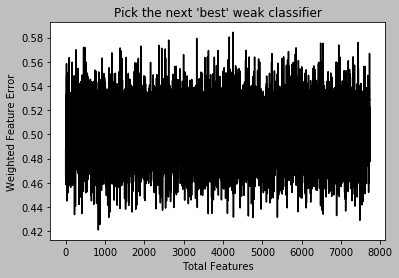

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars


f_i: 0.44027436527436525
TP, TN, FP, FN for the current weak classifier:
0.6936936936936937 0.4257575757575758 0.5742424242424242 0.3063063063063063
Threshold: 95.88008235508235
Classification error: 0.48439073514602216


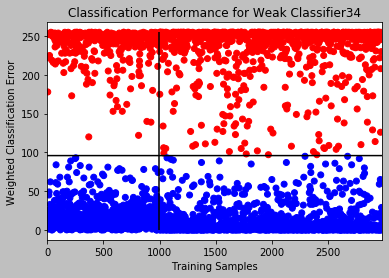

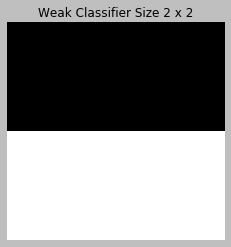

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


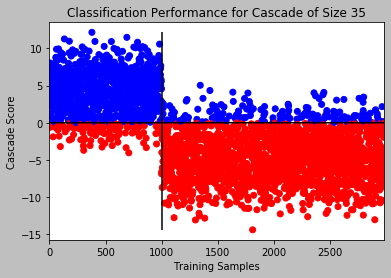

F_i: 0.09823232323232323
Cascade size: 35
 
Best feature index: 7484/7742


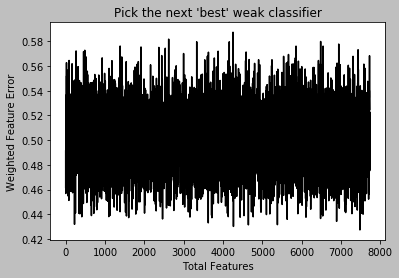

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars


f_i: 0.4455523705523705
TP, TN, FP, FN for the current weak classifier:
0.5215215215215215 0.5873737373737373 0.4126262626262626 0.47847847847847846
Threshold: 118.56025798525798
Classification error: 0.4347096341054045


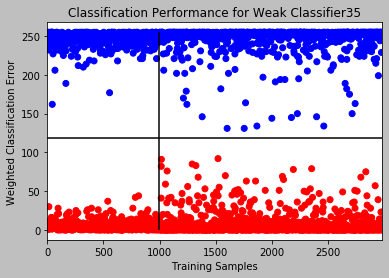

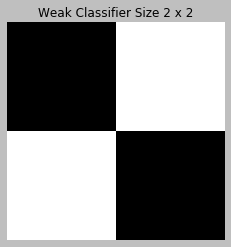

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


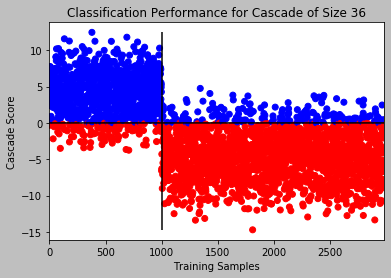

F_i: 0.10224542724542723
Cascade size: 36
 
Best feature index: 2464/7742


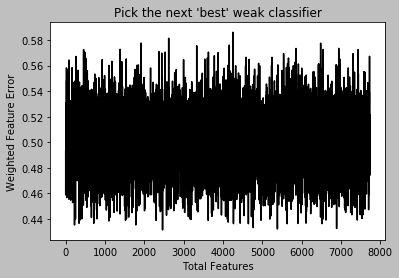

f_i: 0.3313108563108563
TP, TN, FP, FN for the current weak classifier:
0.6106106106106106 0.7267676767676767 0.2732323232323232 0.3893893893893894
Threshold: -75.24758394758395
Classification error: 0.3121852970795569


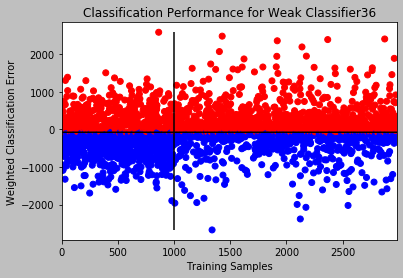

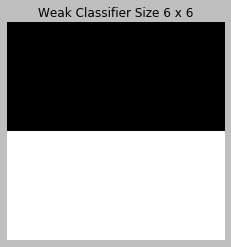

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


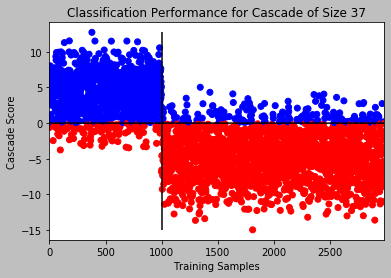

F_i: 0.09898534898534898
Cascade size: 37
 
Best feature index: 6891/7742


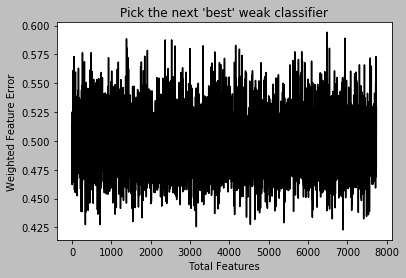

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars


f_i: 0.46459413959413964
TP, TN, FP, FN for the current weak classifier:
0.5995995995995996 0.4712121212121212 0.5287878787878788 0.4004004004004004
Threshold: 112.34126171626173
Classification error: 0.48573346760657937


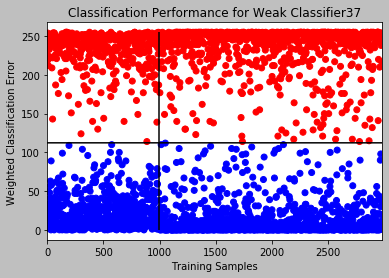

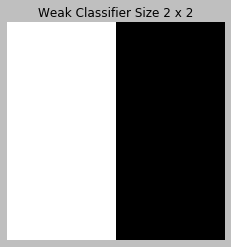

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


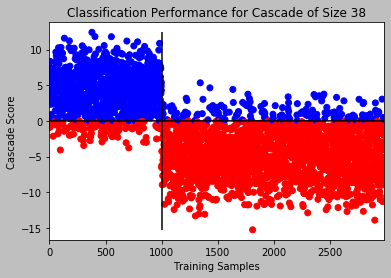

F_i: 0.09622122122122122
Cascade size: 38
 
Best feature index: 3161/7742


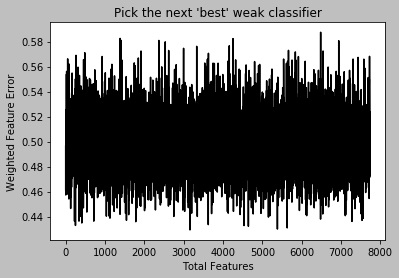

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars


f_i: 0.46867094367094364
TP, TN, FP, FN for the current weak classifier:
0.4964964964964965 0.5661616161616162 0.43383838383838386 0.5035035035035035
Threshold: 118.86716944216944
Classification error: 0.45720040281973817


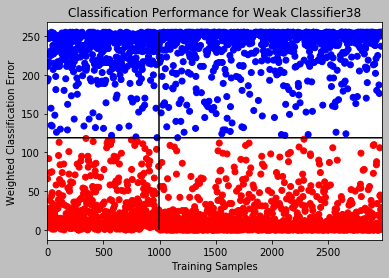

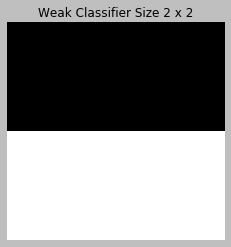

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


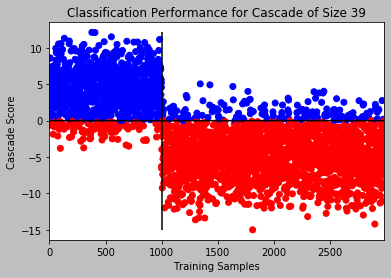

F_i: 0.09697879697879698
Cascade size: 39
 
Best feature index: 5634/7742


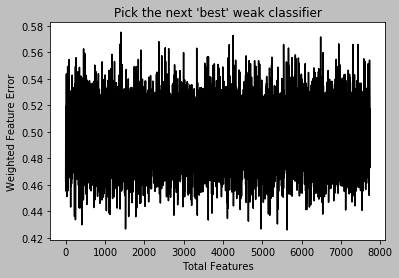

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars


f_i: 0.4346892346892347
TP, TN, FP, FN for the current weak classifier:
0.5205205205205206 0.6101010101010101 0.3898989898989899 0.4794794794794795
Threshold: 116.06514241514242
Classification error: 0.4199395770392749


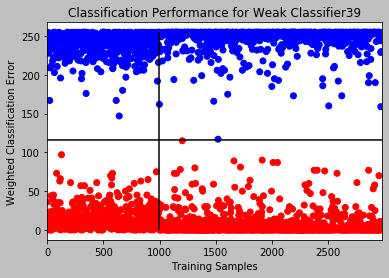

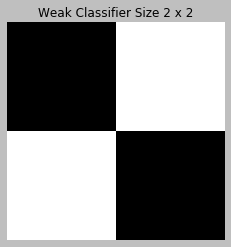

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


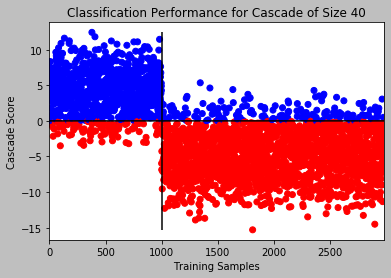

F_i: 0.09522022022022023
Cascade size: 40
 
Best feature index: 4647/7742


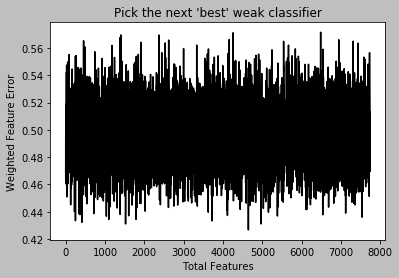

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars


f_i: 0.4160637910637911
TP, TN, FP, FN for the current weak classifier:
0.5895895895895896 0.5782828282828283 0.4217171717171717 0.41041041041041043
Threshold: 126.78254163254164
Classification error: 0.4179254783484391


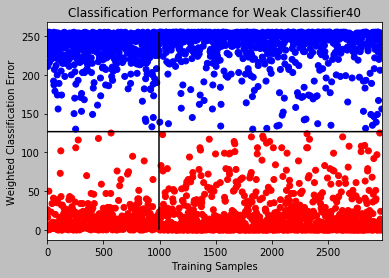

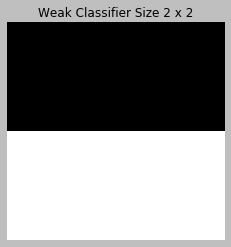

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


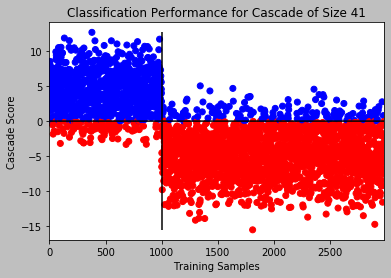

F_i: 0.09194649194649195
Cascade size: 41
 
Best feature index: 1523/7742


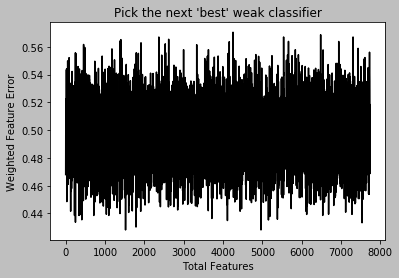

f_i: 0.35741878241878244
TP, TN, FP, FN for the current weak classifier:
0.5765765765765766 0.7085858585858585 0.2914141414141414 0.42342342342342343
Threshold: 33.06803621803621
Classification error: 0.3356831151393085


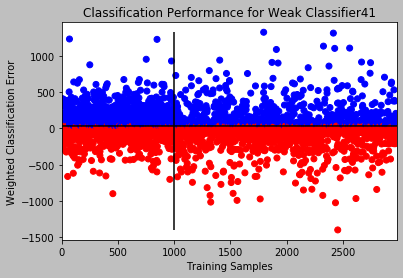

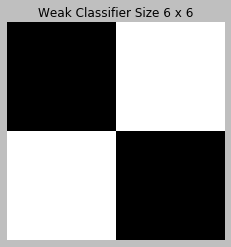

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


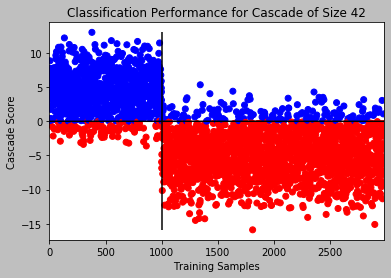

F_i: 0.09145054145054145
Cascade size: 42
 
Best feature index: 7538/7742


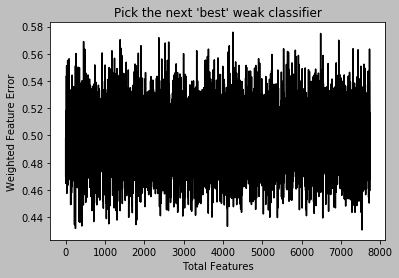

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars


f_i: 0.4426267176267176
TP, TN, FP, FN for the current weak classifier:
0.6556556556556556 0.4590909090909091 0.5409090909090909 0.34434434434434436
Threshold: 103.78885703885703
Classification error: 0.47499160792212153


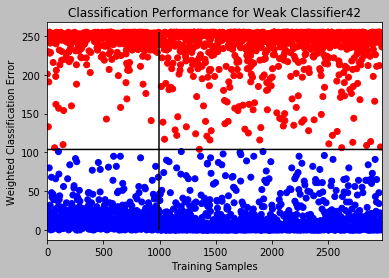

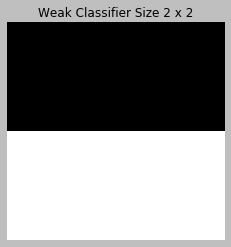

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


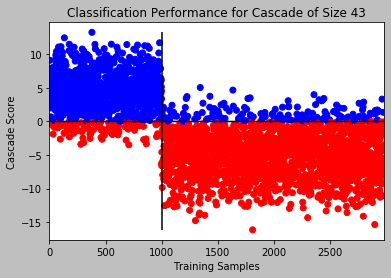

F_i: 0.09271771771771772
Cascade size: 43
 
Best feature index: 1789/7742


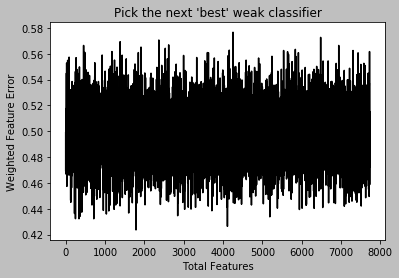

f_i: 0.37682227682227687
TP, TN, FP, FN for the current weak classifier:
0.5675675675675675 0.6787878787878788 0.3212121212121212 0.43243243243243246
Threshold: 21.268680043680043
Classification error: 0.35850956696878145


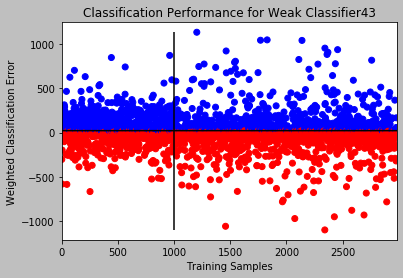

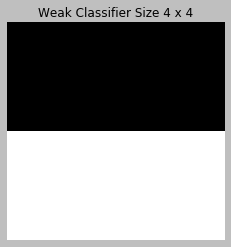

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


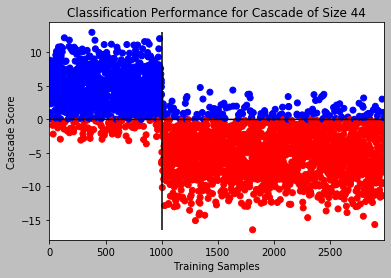

F_i: 0.0891960141960142
Cascade size: 44
 
Best feature index: 362/7742


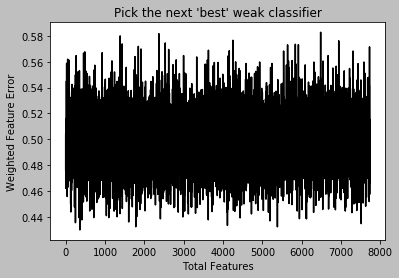

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


f_i: 0.4430657930657931
TP, TN, FP, FN for the current weak classifier:
0.4744744744744745 0.6393939393939394 0.3606060606060606 0.5255255255255256
Threshold: 107.0489534989535
Classification error: 0.4159113796576032


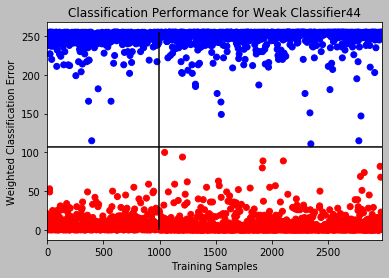

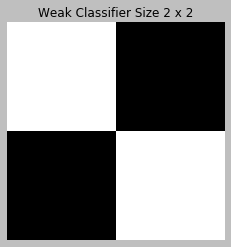

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


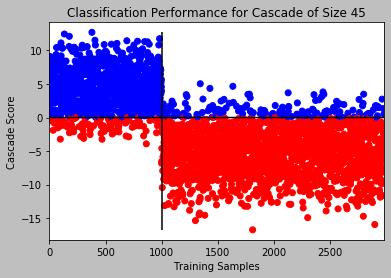

F_i: 0.0916985166985167
Cascade size: 45
 
Best feature index: 5385/7742


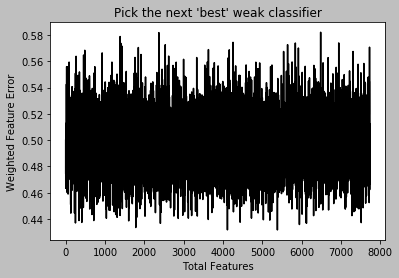

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


f_i: 0.47780052780052784
TP, TN, FP, FN for the current weak classifier:
0.4494494494494494 0.5949494949494949 0.40505050505050505 0.5505505505505506
Threshold: 110.40770998270999
Classification error: 0.4538435716683451


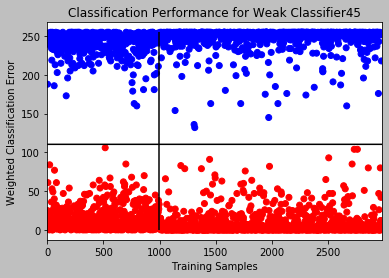

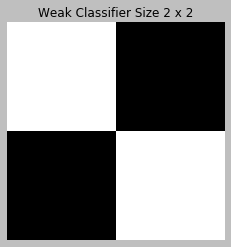

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


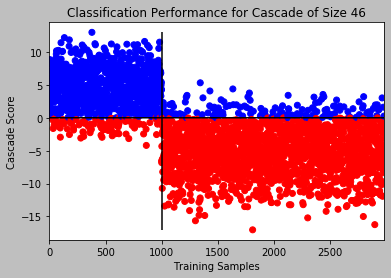

F_i: 0.08667531167531167
Cascade size: 46
 
Best feature index: 2409/7742


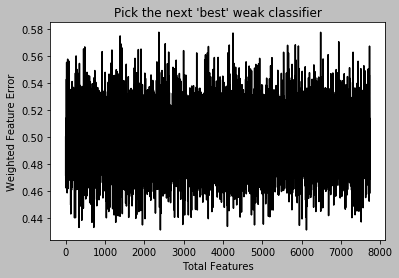

f_i: 0.4224610974610975
TP, TN, FP, FN for the current weak classifier:
0.5525525525525525 0.6025252525252526 0.3974747474747475 0.44744744744744747
Threshold: -3.1529575029575025
Classification error: 0.4142329640819067


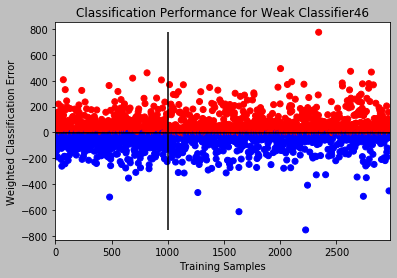

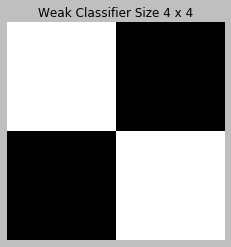

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


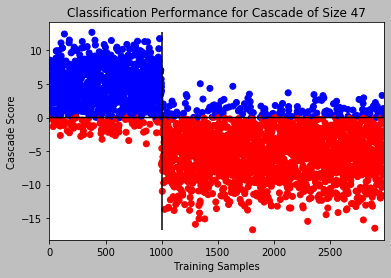

F_i: 0.08793338793338792
Cascade size: 47
 
Best feature index: 4114/7742


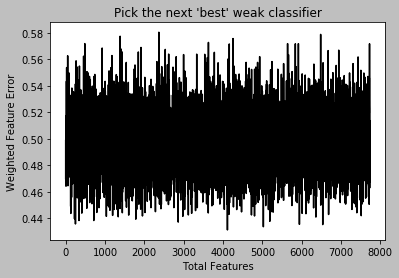

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars


f_i: 0.48881836381836385
TP, TN, FP, FN for the current weak classifier:
0.4844844844844845 0.5378787878787878 0.4621212121212121 0.5155155155155156
Threshold: 122.31606834106833
Classification error: 0.48002685464921113


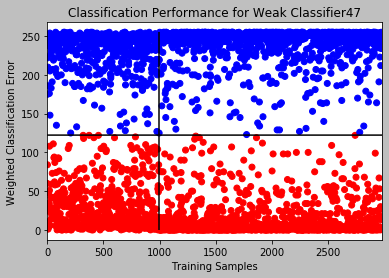

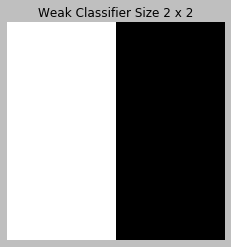

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


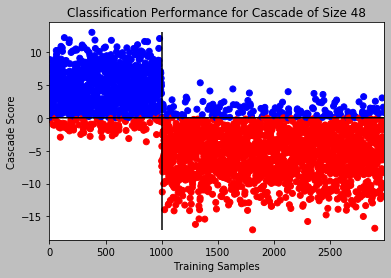

F_i: 0.08493038493038493
Cascade size: 48
 
Best feature index: 5028/7742


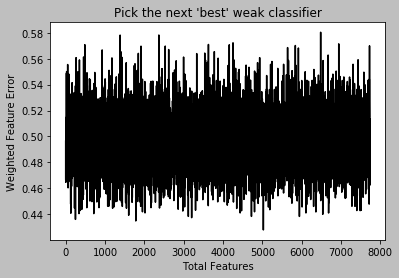

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars


f_i: 0.3455478205478205
TP, TN, FP, FN for the current weak classifier:
0.7427427427427428 0.5661616161616162 0.43383838383838386 0.25725725725725723
Threshold: 143.4498270998271
Classification error: 0.37462235649546827


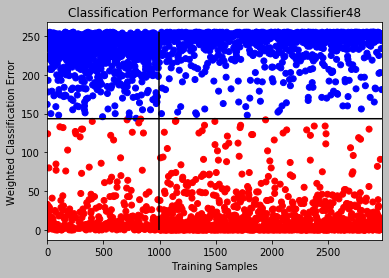

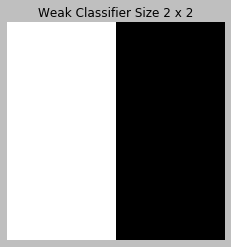

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


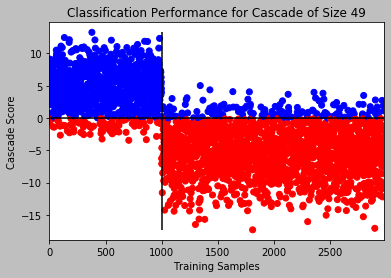

F_i: 0.08493038493038493
Cascade size: 49
 
Best feature index: 1783/7742


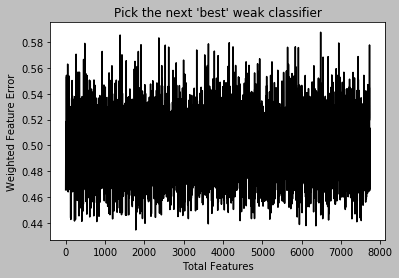

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


f_i: 0.43771953771953775
TP, TN, FP, FN for the current weak classifier:
0.5205205205205206 0.604040404040404 0.39595959595959596 0.4794794794794795
Threshold: 116.79016971516972
Classification error: 0.42396777442094663


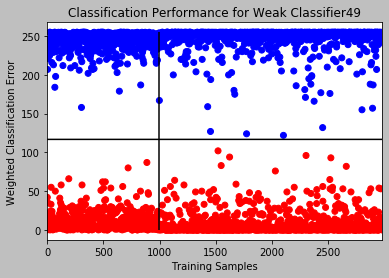

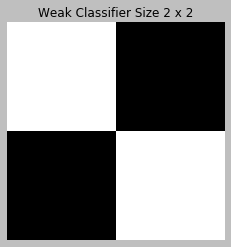

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


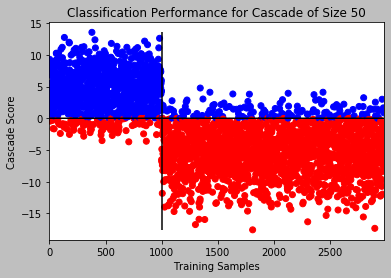

F_i: 0.08366775866775866
Cascade size: 50
 
Best feature index: 6364/7742


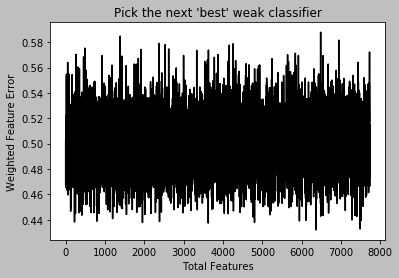

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars


f_i: 0.4284056784056784
TP, TN, FP, FN for the current weak classifier:
0.5825825825825826 0.5606060606060606 0.4393939393939394 0.4174174174174174
Threshold: 129.31883474383474
Classification error: 0.43202416918429004


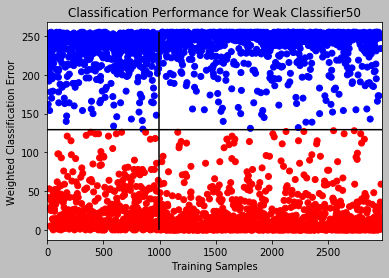

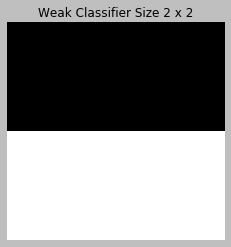

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


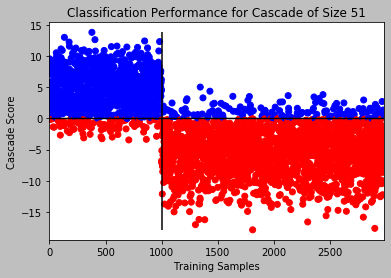

F_i: 0.08316270816270815
Cascade size: 51
 
Best feature index: 7491/7742


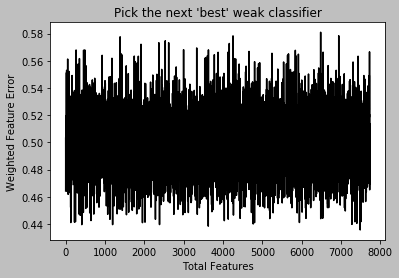

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars


f_i: 0.44360041860041854
TP, TN, FP, FN for the current weak classifier:
0.6476476476476476 0.46515151515151515 0.5348484848484848 0.35235235235235235
Threshold: 106.11201428701429
Classification error: 0.47364887546156426


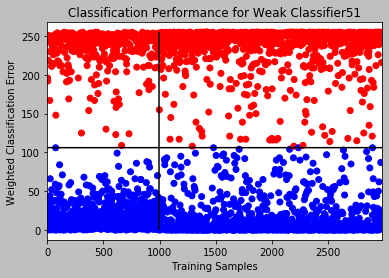

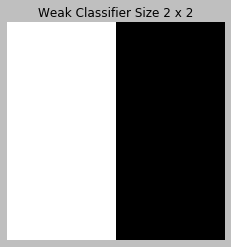

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


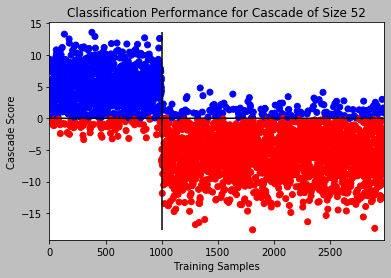

F_i: 0.08442533442533443
Cascade size: 52
 
Best feature index: 3627/7742


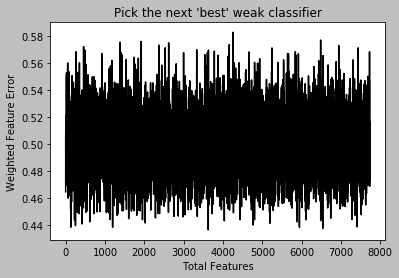

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars


f_i: 0.5074119574119574
TP, TN, FP, FN for the current weak classifier:
0.4084084084084084 0.5767676767676768 0.42323232323232324 0.5915915915915916
Threshold: 109.16972426972427
Classification error: 0.4796911715340718


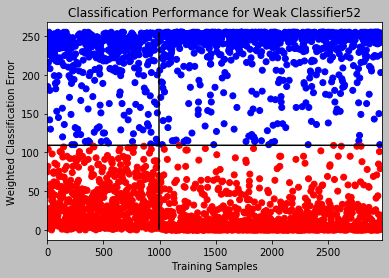

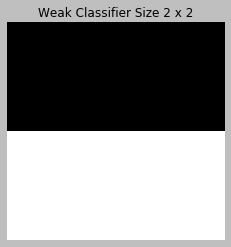

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


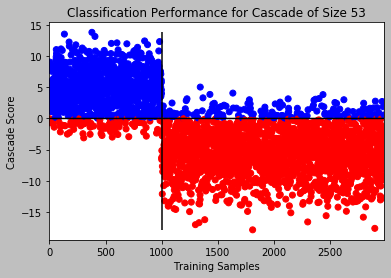

F_i: 0.08367230867230868
Cascade size: 53
 
Best feature index: 6538/7742


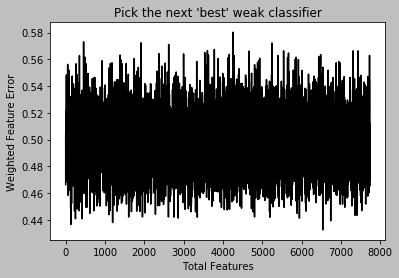

f_i: 0.42164664664664664
TP, TN, FP, FN for the current weak classifier:
0.4844844844844845 0.6722222222222223 0.3277777777777778 0.5155155155155156
Threshold: 23.23683001183001
Classification error: 0.3907351460221551


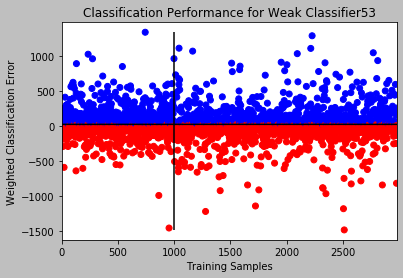

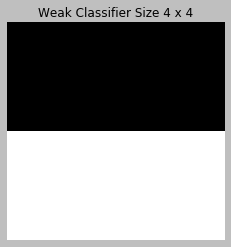

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


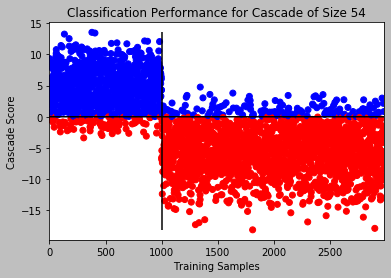

F_i: 0.08240968240968241
Cascade size: 54
 
Best feature index: 131/7742


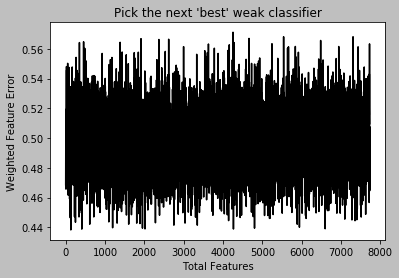

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars


f_i: 0.4655086905086905
TP, TN, FP, FN for the current weak classifier:
0.4674674674674675 0.6015151515151516 0.3984848484848485 0.5325325325325325
Threshold: 110.99754299754301
Classification error: 0.4434373950990265


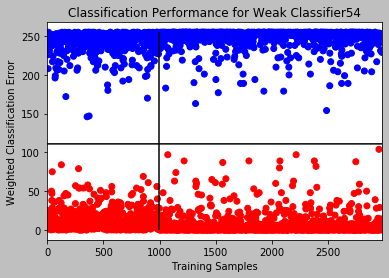

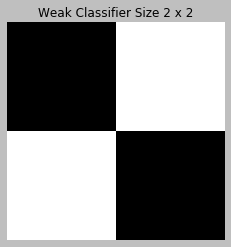

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


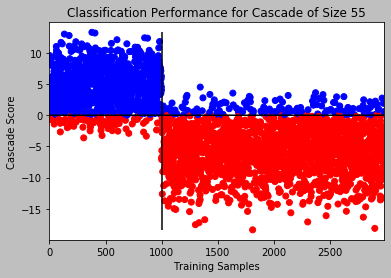

F_i: 0.08217080717080717
Cascade size: 55
 
Best feature index: 4267/7742


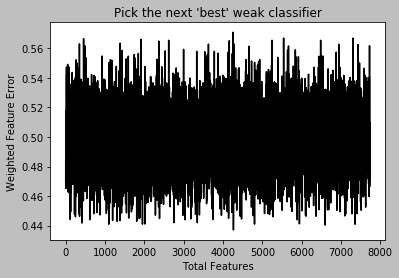

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars


f_i: 0.45486395486395487
TP, TN, FP, FN for the current weak classifier:
0.5145145145145145 0.5757575757575758 0.42424242424242425 0.4854854854854855
Threshold: 118.99985667485669
Classification error: 0.44478012755958374


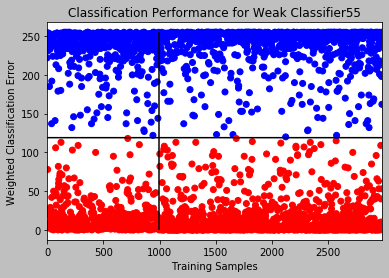

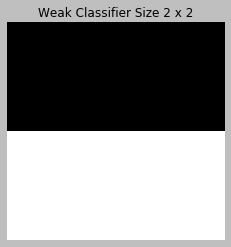

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


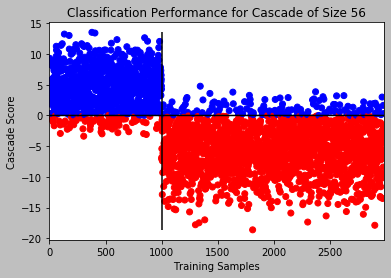

F_i: 0.08167485667485667
Cascade size: 56
 
Best feature index: 7359/7742


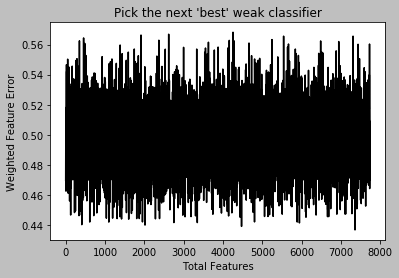

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars


f_i: 0.4029120029120029
TP, TN, FP, FN for the current weak classifier:
0.7517517517517518 0.44242424242424244 0.5575757575757576 0.24824824824824826
Threshold: 91.25002502502502
Classification error: 0.4538435716683451


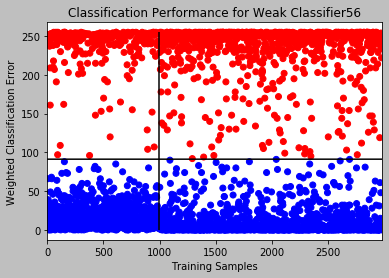

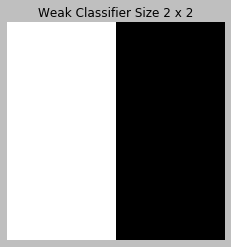

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


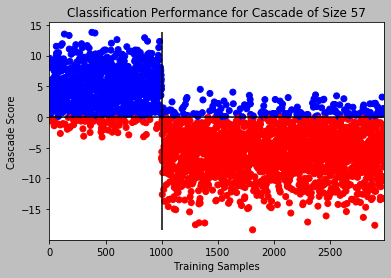

F_i: 0.08167485667485667
Cascade size: 57
 
Best feature index: 339/7742


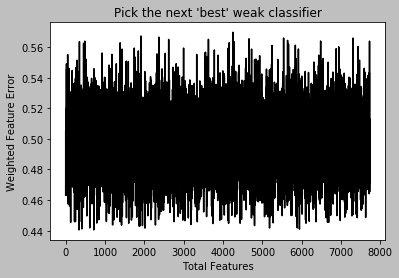

f_i: 0.406988806988807
TP, TN, FP, FN for the current weak classifier:
0.5375375375375375 0.6484848484848484 0.3515151515151515 0.4624624624624625
Threshold: 23.03592456092456
Classification error: 0.38872104733131924


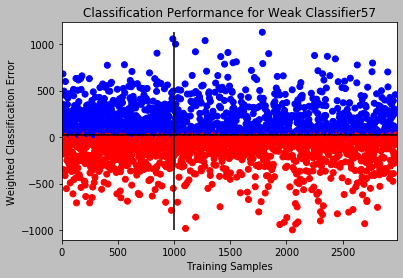

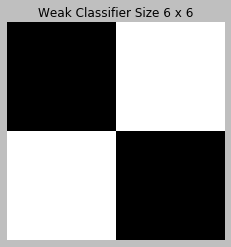

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


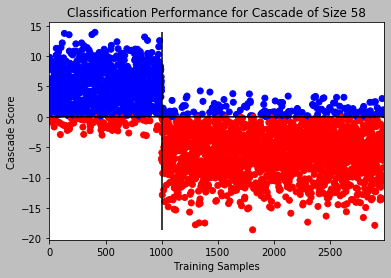

F_i: 0.07992082992082992
Cascade size: 58
 
Best feature index: 410/7742


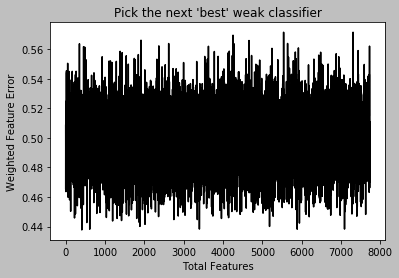

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


f_i: 0.4473063973063973
TP, TN, FP, FN for the current weak classifier:
0.5185185185185185 0.5868686868686869 0.4131313131313131 0.48148148148148145
Threshold: 119.015197015197
Classification error: 0.43605236656596175


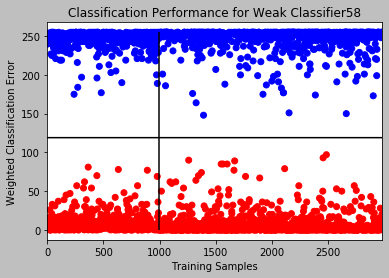

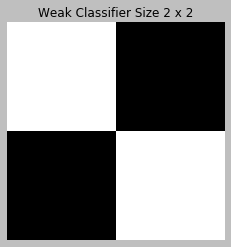

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


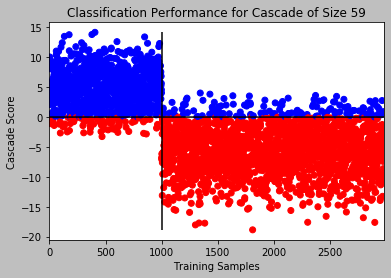

F_i: 0.07665165165165165
Cascade size: 59
 
Best feature index: 612/7742


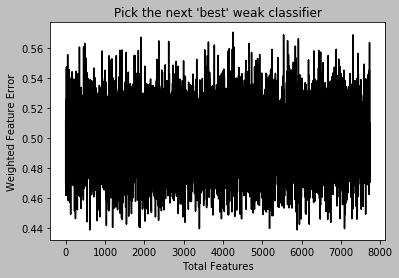

f_i: 0.48210938210938215
TP, TN, FP, FN for the current weak classifier:
0.5085085085085085 0.5272727272727272 0.4727272727272727 0.4914914914914915
Threshold: -2.367688142688143
Classification error: 0.47901980530379323


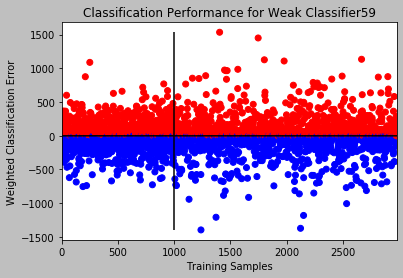

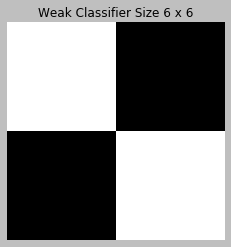

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


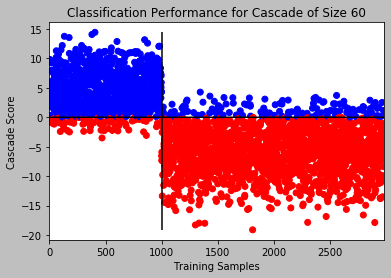

F_i: 0.0753981253981254
Cascade size: 60
 
Best feature index: 2283/7742


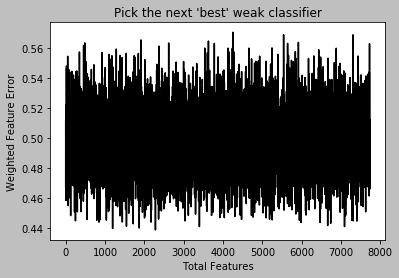

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars


f_i: 0.4867026117026117
TP, TN, FP, FN for the current weak classifier:
0.46346346346346345 0.5631313131313131 0.43686868686868685 0.5365365365365365
Threshold: 115.36922376922377
Classification error: 0.4702920443101712


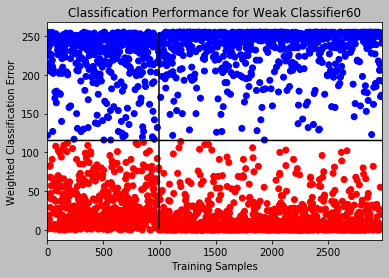

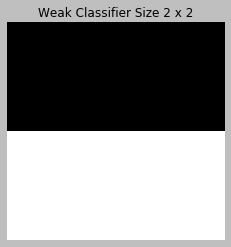

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


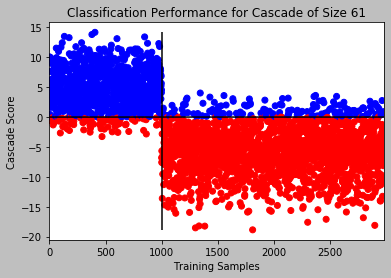

F_i: 0.07815315315315316
Cascade size: 61
 
Best feature index: 3401/7742


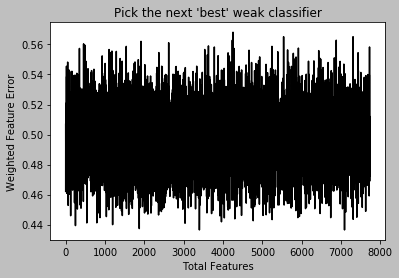

f_i: 0.46212803712803713
TP, TN, FP, FN for the current weak classifier:
0.5015015015015015 0.5742424242424242 0.4257575757575758 0.4984984984984985
Threshold: 1.145893620893621
Classification error: 0.4501510574018127


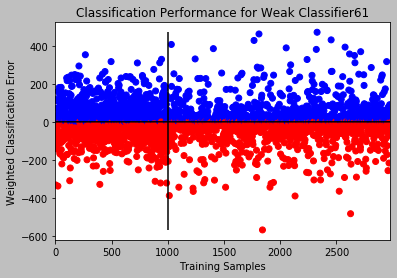

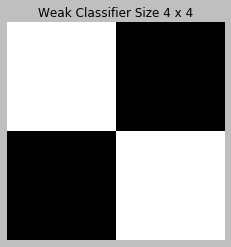

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


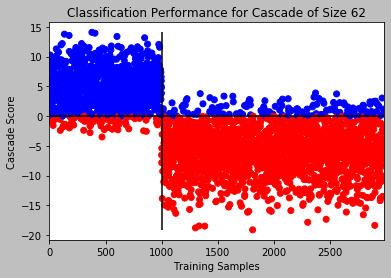

F_i: 0.0768996268996269
Cascade size: 62
 
Best feature index: 792/7742


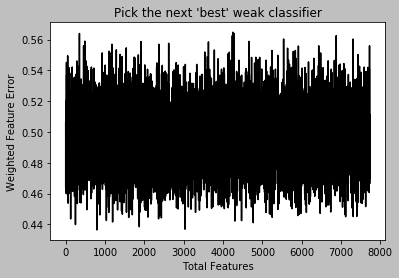

f_i: 0.36193011193011193
TP, TN, FP, FN for the current weak classifier:
0.6246246246246246 0.6515151515151515 0.3484848484848485 0.37537537537537535
Threshold: -284.60997815997814
Classification error: 0.35750251762336355


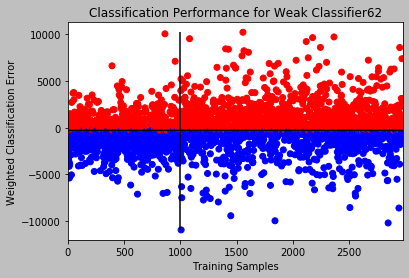

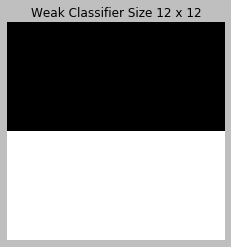

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


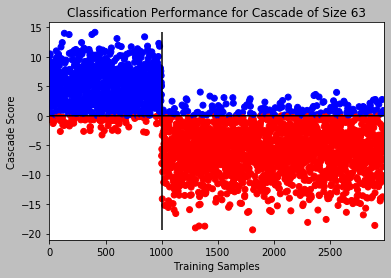

F_i: 0.07690872690872691
Cascade size: 63
 
Best feature index: 5642/7742


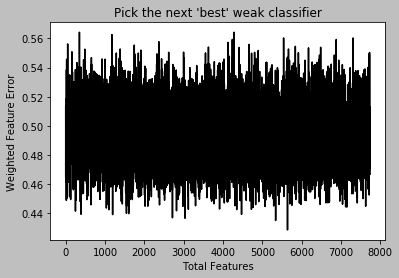

f_i: 0.37238147238147234
TP, TN, FP, FN for the current weak classifier:
0.5905905905905906 0.6646464646464646 0.33535353535353535 0.4094094094094094
Threshold: 278.7256097006097
Classification error: 0.36018798254447804


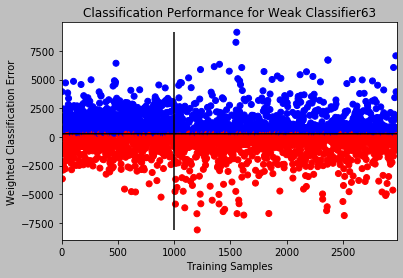

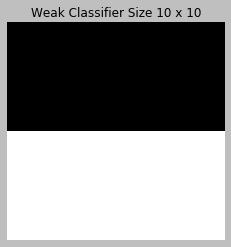

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


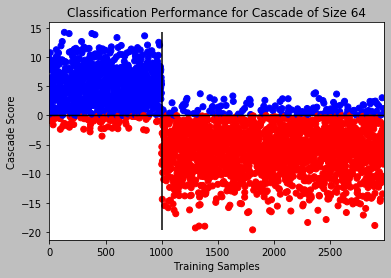

F_i: 0.0763900263900264
Cascade size: 64
 
Best feature index: 3036/7742


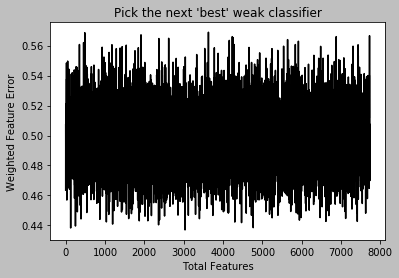

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars


f_i: 0.4081513331513332
TP, TN, FP, FN for the current weak classifier:
0.6266266266266266 0.557070707070707 0.44292929292929295 0.3733733733733734
Threshold: 134.71257166257166
Classification error: 0.4196038939241356


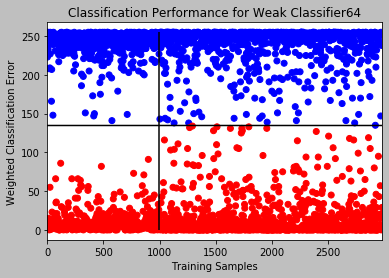

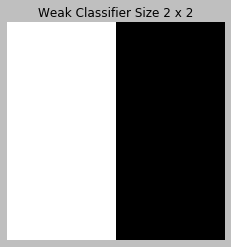

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


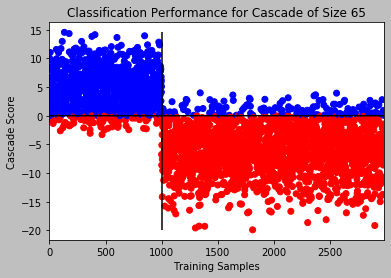

F_i: 0.07513650013650014
Cascade size: 65
 
Best feature index: 1194/7742


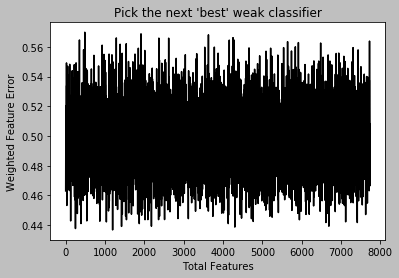

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars


f_i: 0.44241741741741747
TP, TN, FP, FN for the current weak classifier:
0.4984984984984985 0.6166666666666667 0.38333333333333336 0.5015015015015015
Threshold: 112.6970242970243
Classification error: 0.4229607250755287


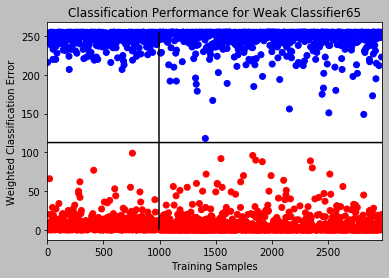

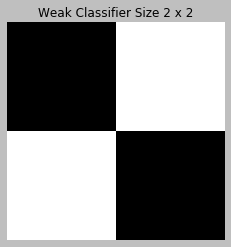

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


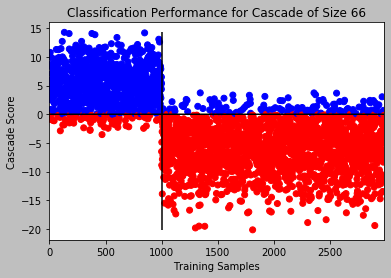

F_i: 0.07411274911274912
Cascade size: 66
 
Best feature index: 4302/7742


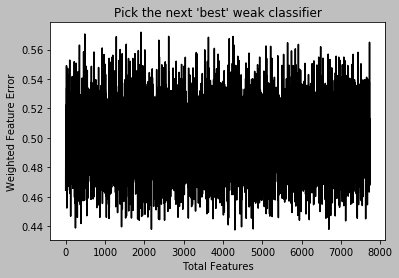

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars


f_i: 0.4447265447265447
TP, TN, FP, FN for the current weak classifier:
0.5065065065065065 0.604040404040404 0.39595959595959596 0.4934934934934935
Threshold: 115.52163527163526
Classification error: 0.42866733803289697


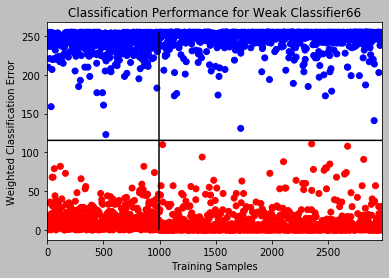

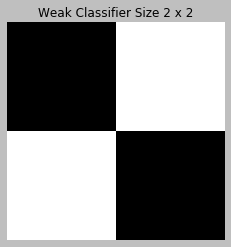

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


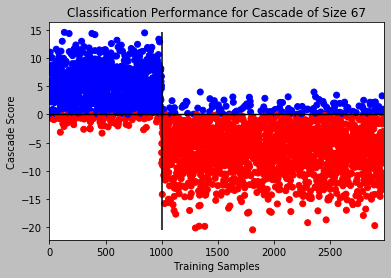

F_i: 0.07587587587587588
Cascade size: 67
 
Best feature index: 390/7742


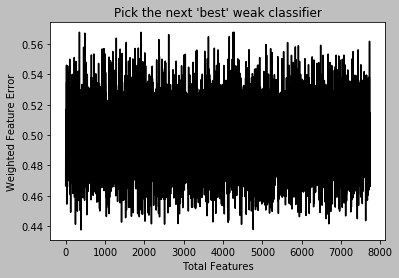

f_i: 0.4484120484120484
TP, TN, FP, FN for the current weak classifier:
0.5395395395395396 0.5636363636363636 0.43636363636363634 0.46046046046046046
Threshold: 701.0350486850487
Classification error: 0.4444444444444444


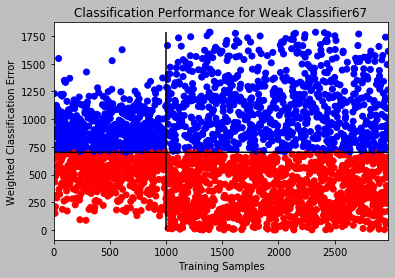

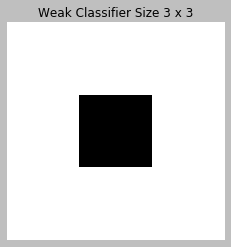

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


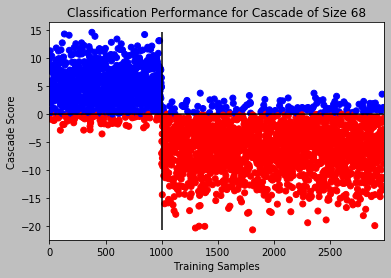

F_i: 0.07211984711984712
Cascade size: 68
 
Best feature index: 4770/7742


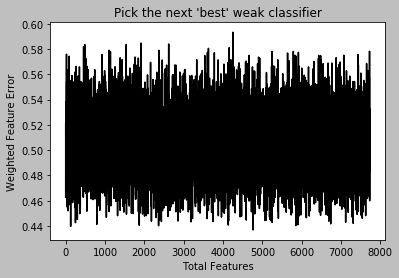

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars


f_i: 0.4679361179361179
TP, TN, FP, FN for the current weak classifier:
0.5015015015015015 0.5626262626262626 0.43737373737373736 0.4984984984984985
Threshold: 118.16005096005097
Classification error: 0.4578717690500168


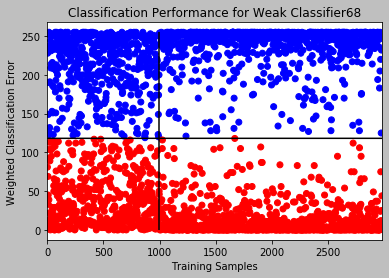

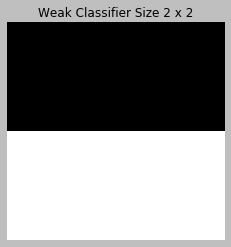

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


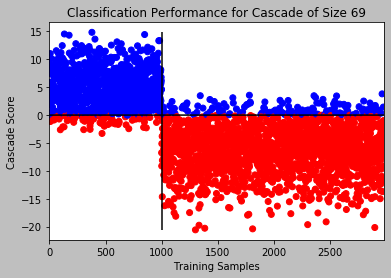

F_i: 0.07263399763399764
Cascade size: 69
 
Best feature index: 2181/7742


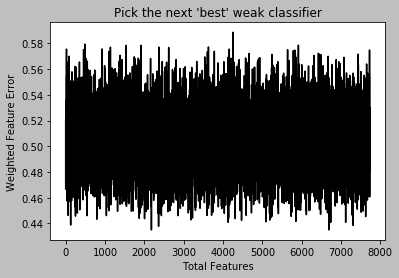

f_i: 0.45632905632905635
TP, TN, FP, FN for the current weak classifier:
0.5035035035035035 0.5838383838383838 0.4161616161616162 0.4964964964964965
Threshold: -4.70514378014378
Classification error: 0.4431017119838872


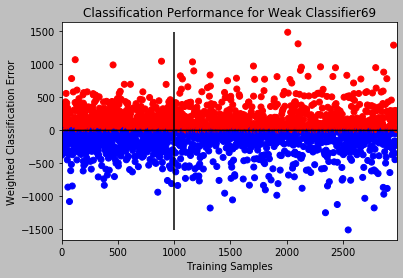

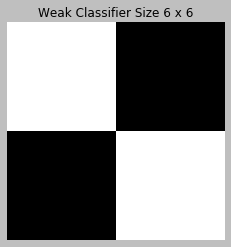

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


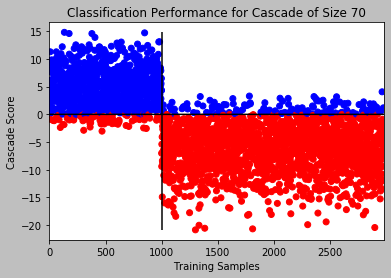

F_i: 0.07212439712439712
Cascade size: 70
 
Best feature index: 7630/7742


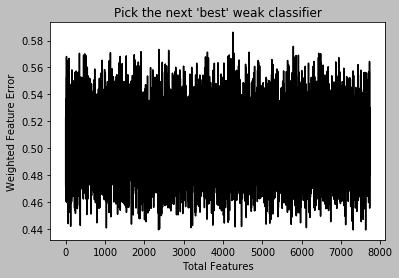

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars


f_i: 0.4532578032578033
TP, TN, FP, FN for the current weak classifier:
0.4944944944944945 0.598989898989899 0.401010101010101 0.5055055055055055
Threshold: 114.05844253344253
Classification error: 0.43605236656596175


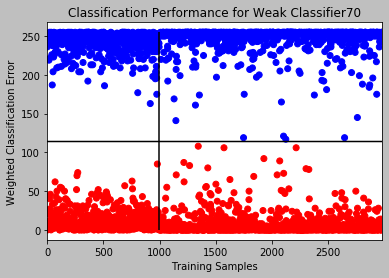

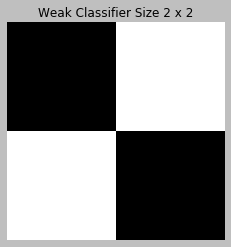

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


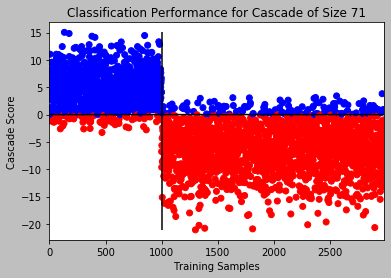

F_i: 0.07437437437437437
Cascade size: 71
 
Best feature index: 7313/7742


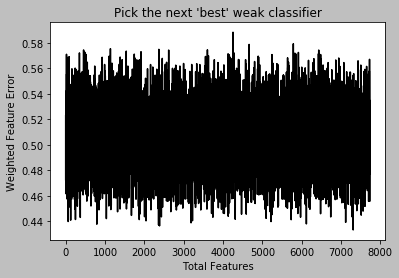

f_i: 0.2534807534807535
TP, TN, FP, FN for the current weak classifier:
0.6546546546546547 0.8383838383838383 0.16161616161616163 0.34534534534534533
Threshold: -76.57880607880608
Classification error: 0.22322927156764014


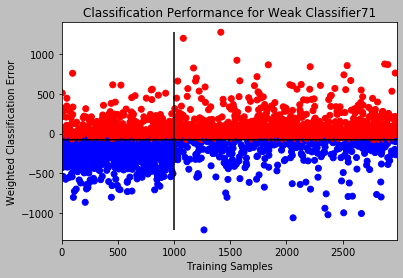

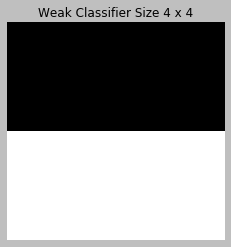

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


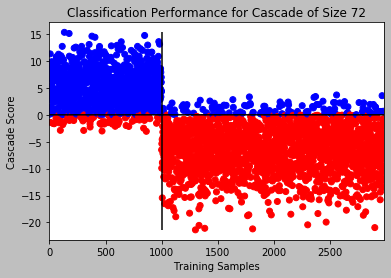

F_i: 0.0726066976066976
Cascade size: 72
 
Best feature index: 2363/7742


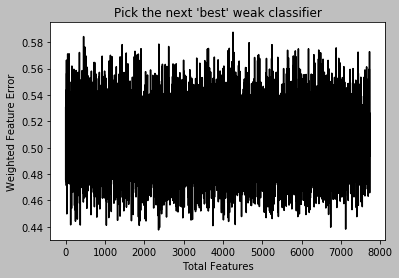

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars


f_i: 0.4634680134680135
TP, TN, FP, FN for the current weak classifier:
0.5185185185185185 0.5545454545454546 0.44545454545454544 0.48148148148148145
Threshold: 123.22336427336427
Classification error: 0.4575360859348775


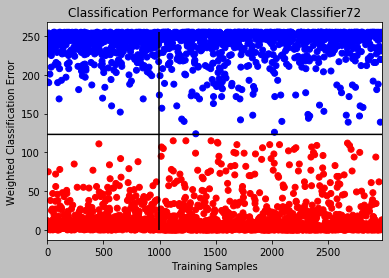

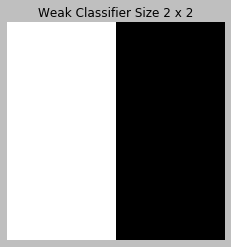

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


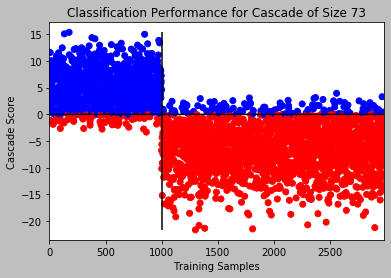

F_i: 0.07133952133952134
Cascade size: 73
 
Best feature index: 3744/7742


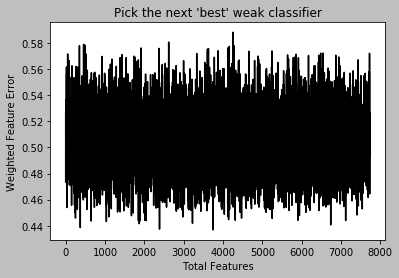

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


f_i: 0.44690372190372185
TP, TN, FP, FN for the current weak classifier:
0.4854854854854855 0.6207070707070707 0.3792929292929293 0.5145145145145145
Threshold: 110.62342797342797
Classification error: 0.42463914065122527


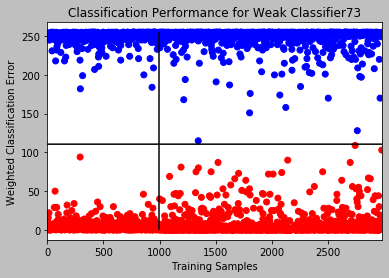

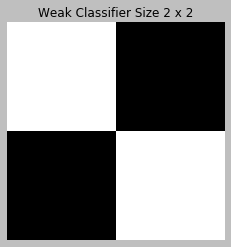

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


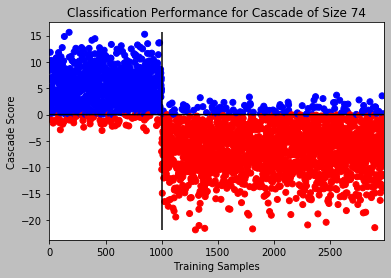

F_i: 0.06933751933751933
Cascade size: 74
 
Best feature index: 6741/7742


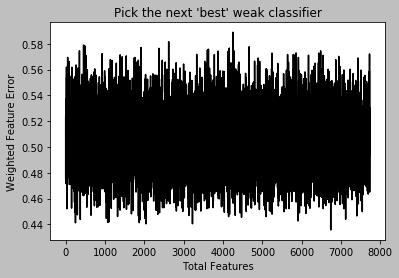

f_i: 0.33132450632450633
TP, TN, FP, FN for the current weak classifier:
0.6136136136136137 0.7237373737373738 0.27626262626262627 0.3863863863863864
Threshold: 264.47960915460914
Classification error: 0.31319234642497484


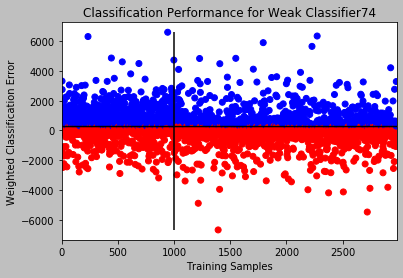

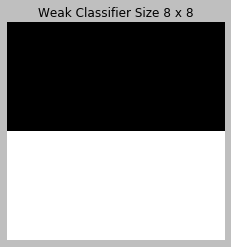

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


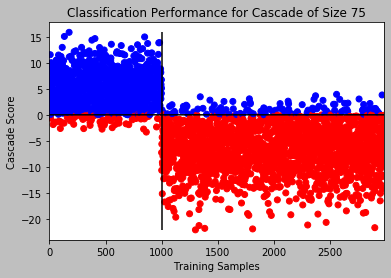

F_i: 0.06857539357539358
Cascade size: 75
 
Best feature index: 4135/7742


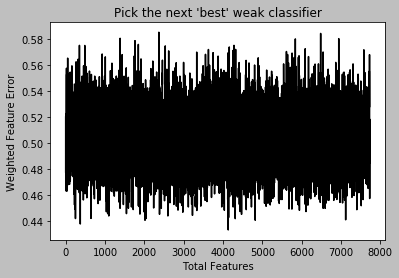

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars


f_i: 0.5023933023933024
TP, TN, FP, FN for the current weak classifier:
0.41541541541541543 0.5797979797979798 0.4202020202020202 0.5845845845845846
Threshold: 109.94304531804532
Classification error: 0.47532729103726085


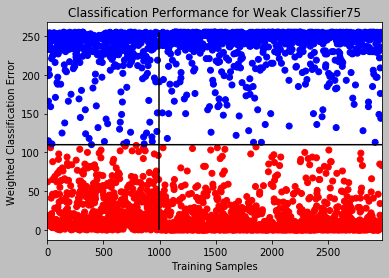

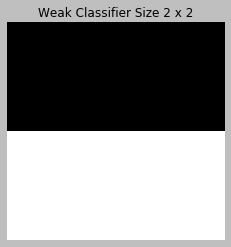

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


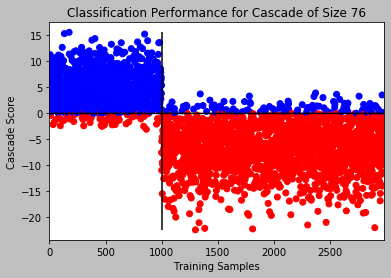

F_i: 0.06505824005824007
Cascade size: 76
 
Best feature index: 372/7742


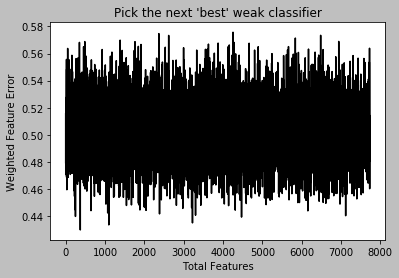

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars


f_i: 0.4113386113386114
TP, TN, FP, FN for the current weak classifier:
0.7167167167167167 0.46060606060606063 0.5393939393939394 0.2832832832832833
Threshold: 96.79652834652835
Classification error: 0.4535078885532058


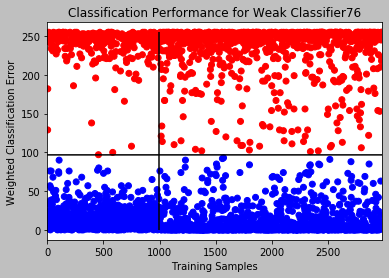

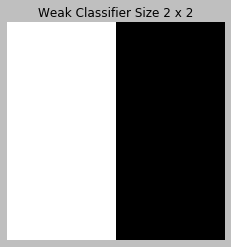

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


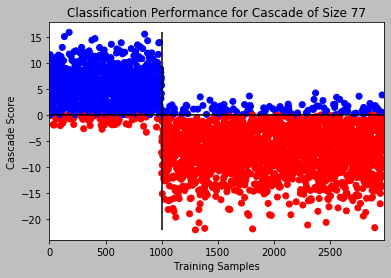

F_i: 0.06657339157339158
Cascade size: 77
 
Best feature index: 3225/7742


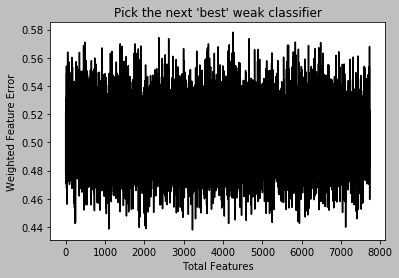

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars


f_i: 0.39454226954226956
TP, TN, FP, FN for the current weak classifier:
0.7437437437437437 0.4671717171717172 0.5328282828282829 0.25625625625625625
Threshold: 95.15499817999819
Classification error: 0.44008056394763345


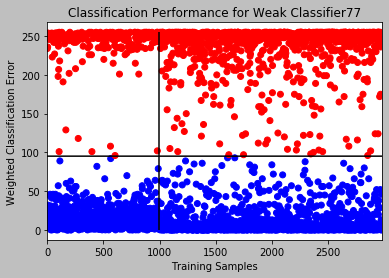

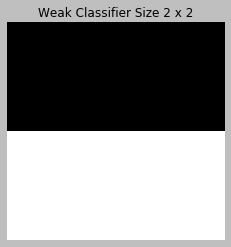

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


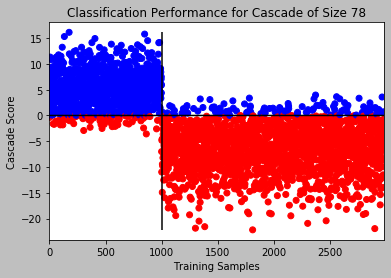

F_i: 0.06557239057239057
Cascade size: 78
 
Best feature index: 2044/7742


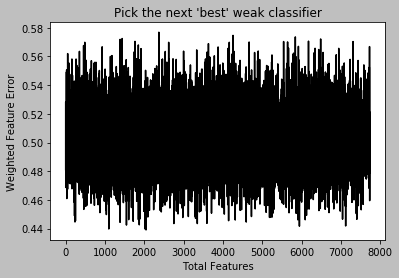

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars


f_i: 0.38654336154336155
TP, TN, FP, FN for the current weak classifier:
0.6506506506506506 0.5762626262626263 0.42373737373737375 0.34934934934934936
Threshold: 131.91545181545183
Classification error: 0.3987915407854985


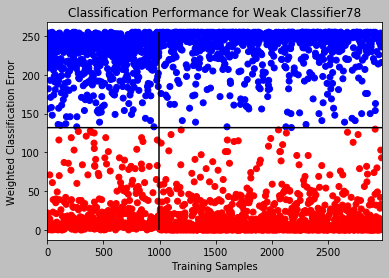

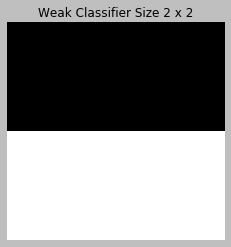

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


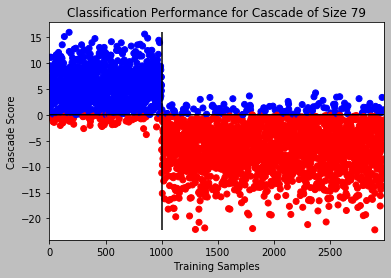

F_i: 0.06407088907088906
Cascade size: 79
 
Best feature index: 2018/7742


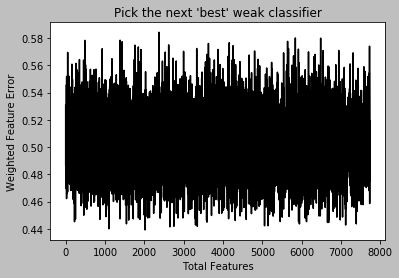

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


f_i: 0.45327145327145324
TP, TN, FP, FN for the current weak classifier:
0.4974974974974975 0.5959595959595959 0.40404040404040403 0.5025025025025025
Threshold: 115.08835198835199
Classification error: 0.43705941591137965


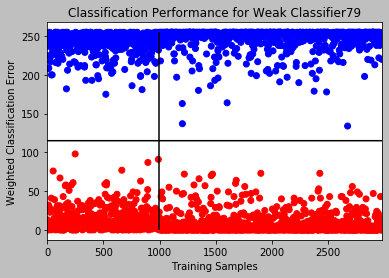

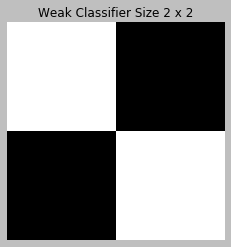

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


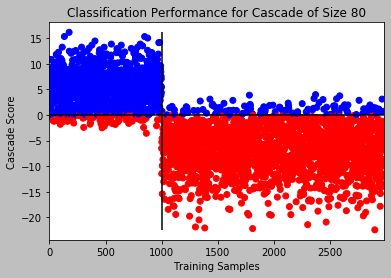

F_i: 0.06657794157794159
Cascade size: 80
 
Best feature index: 1097/7742


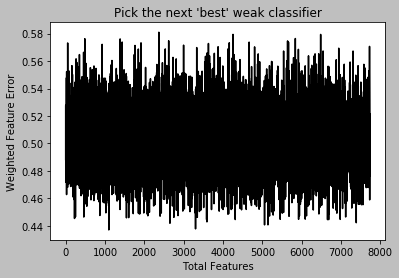

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars


f_i: 0.3975998725998726
TP, TN, FP, FN for the current weak classifier:
0.7497497497497497 0.45505050505050504 0.544949494949495 0.2502502502502503
Threshold: 94.00433387933388
Classification error: 0.446122860020141


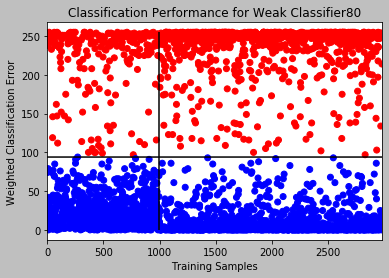

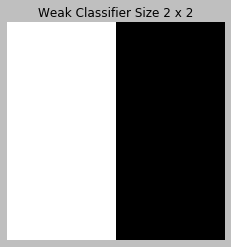

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


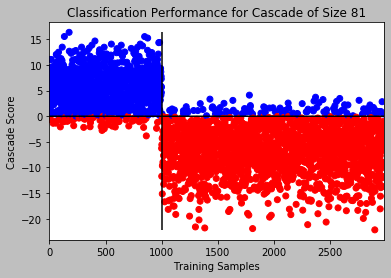

F_i: 0.06406633906633907
Cascade size: 81
 
Best feature index: 7391/7742


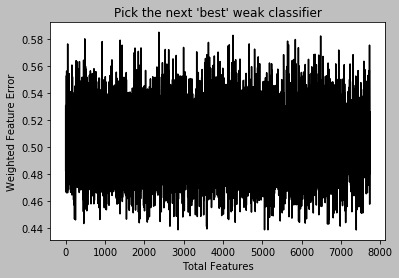

f_i: 0.40988943488943486
TP, TN, FP, FN for the current weak classifier:
0.5645645645645646 0.6156565656565657 0.3843434343434343 0.43543543543543545
Threshold: -77.30072345072345
Classification error: 0.40147700570661293


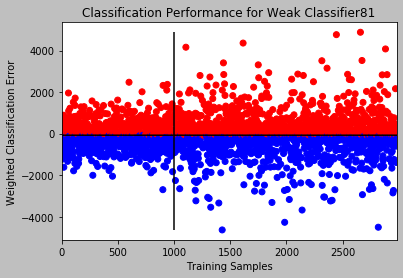

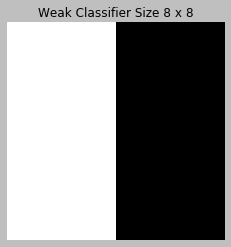

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


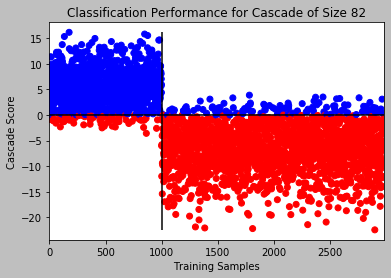

F_i: 0.06407543907543908
Cascade size: 82
 
Best feature index: 2857/7742


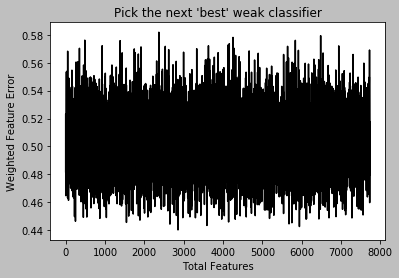

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


f_i: 0.48200245700245703
TP, TN, FP, FN for the current weak classifier:
0.4294294294294294 0.6065656565656565 0.3934343434343434 0.5705705705705706
Threshold: 105.74054054054054
Classification error: 0.45283652232292715


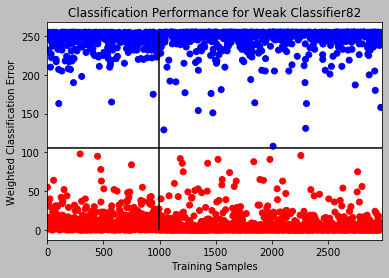

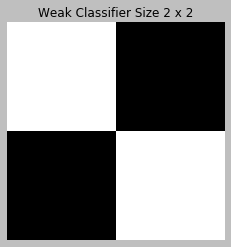

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


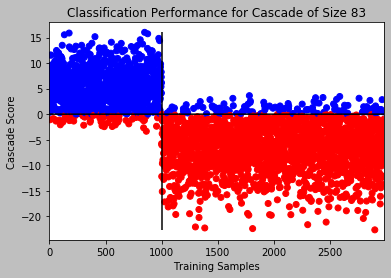

F_i: 0.061315861315861316
Cascade size: 83
 
Best feature index: 5754/7742


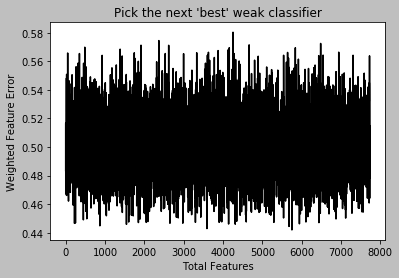

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars


f_i: 0.4536923286923287
TP, TN, FP, FN for the current weak classifier:
0.5345345345345346 0.5580808080808081 0.44191919191919193 0.46546546546546547
Threshold: 125.51574984074985
Classification error: 0.4498153742866734


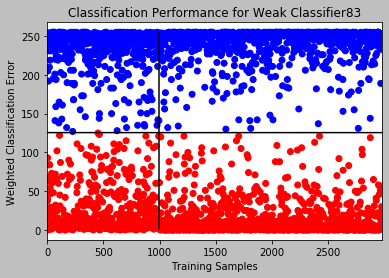

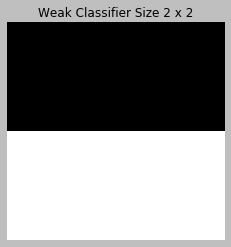

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


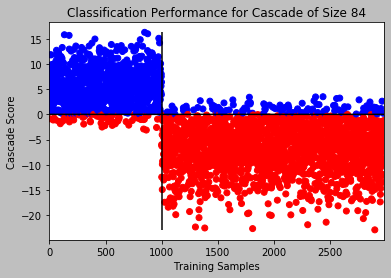

F_i: 0.06231231231231231
Cascade size: 84
 
Best feature index: 3593/7742


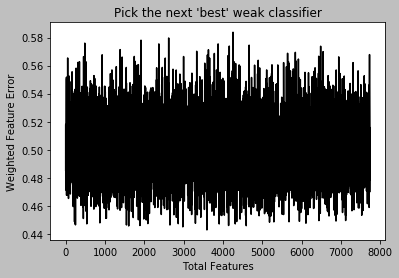

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars


f_i: 0.4687141687141687
TP, TN, FP, FN for the current weak classifier:
0.45045045045045046 0.6121212121212121 0.3878787878787879 0.5495495495495496
Threshold: 107.5910546910547
Classification error: 0.4420946626384693


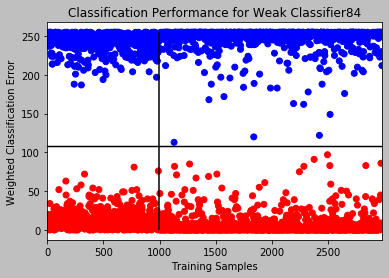

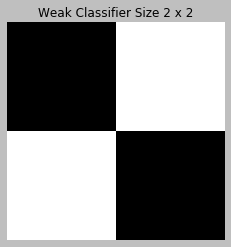

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


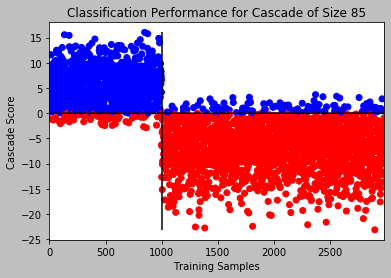

F_i: 0.06306988806988807
Cascade size: 85
 
Best feature index: 1546/7742


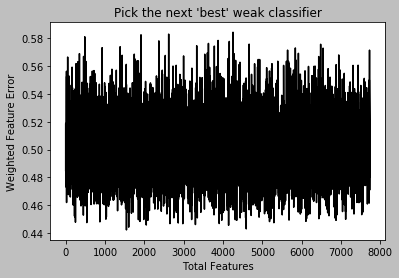

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars


f_i: 0.44911502411502413
TP, TN, FP, FN for the current weak classifier:
0.5275275275275275 0.5742424242424242 0.4257575757575758 0.4724724724724725
Threshold: 121.39956092456092
Classification error: 0.44142329640819067


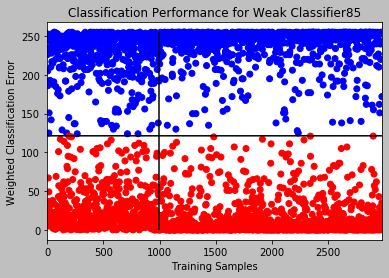

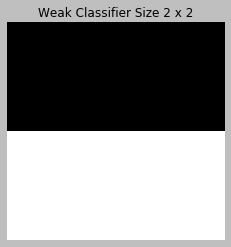

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


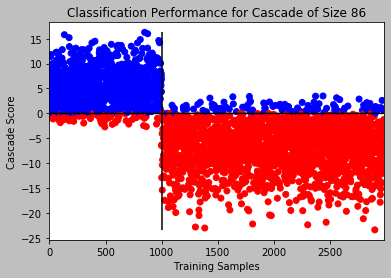

F_i: 0.06005323505323505
Cascade size: 86
 
Best feature index: 1603/7742


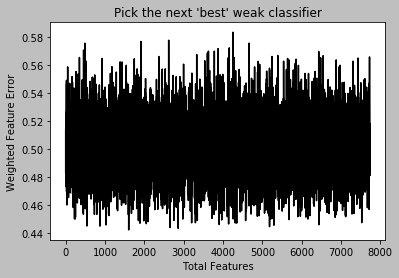

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars


f_i: 0.40531895531895534
TP, TN, FP, FN for the current weak classifier:
0.6146146146146146 0.5747474747474748 0.42525252525252527 0.38538538538538536
Threshold: 130.59859177359178
Classification error: 0.4118831822759315


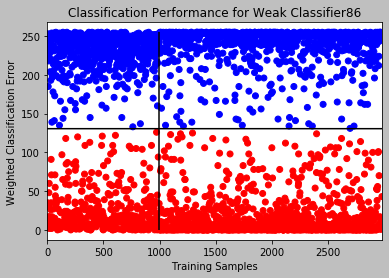

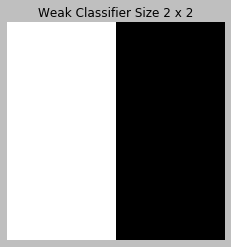

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


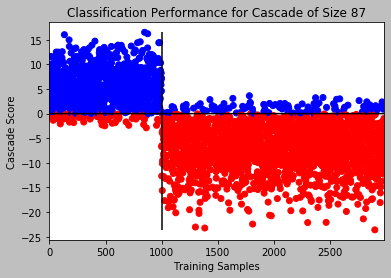

F_i: 0.06255573755573755
Cascade size: 87
 
Best feature index: 2863/7742


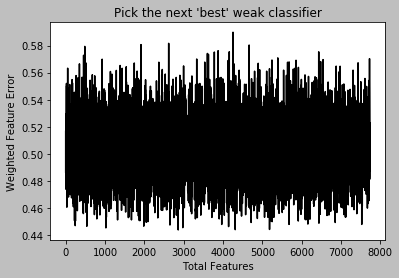

f_i: 0.38690736190736186
TP, TN, FP, FN for the current weak classifier:
0.6196196196196196 0.6065656565656565 0.3934343434343434 0.38038038038038036
Threshold: 221.75811948311946
Classification error: 0.38905673044645855


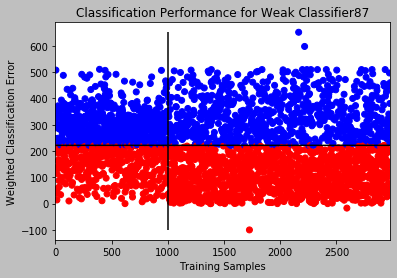

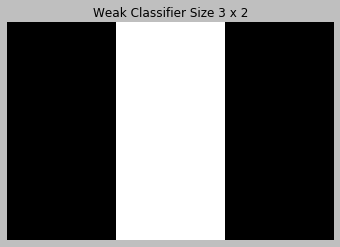

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


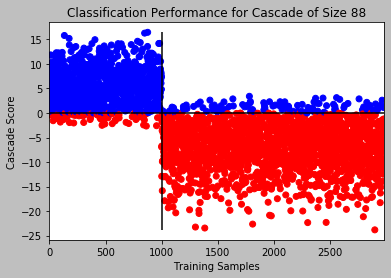

F_i: 0.060305760305760306
Cascade size: 88
 
Best feature index: 2979/7742


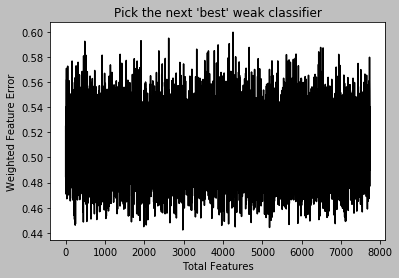

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars


f_i: 0.44995904995904995
TP, TN, FP, FN for the current weak classifier:
0.5465465465465466 0.5535353535353535 0.44646464646464645 0.45345345345345345
Threshold: 127.74535444535445
Classification error: 0.44880832494125544


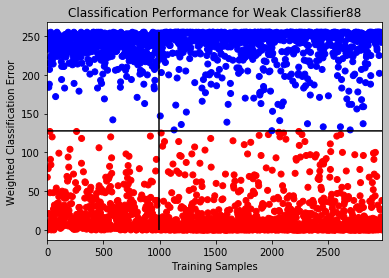

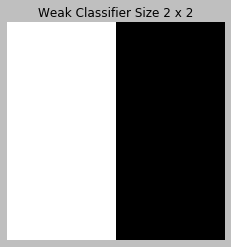

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


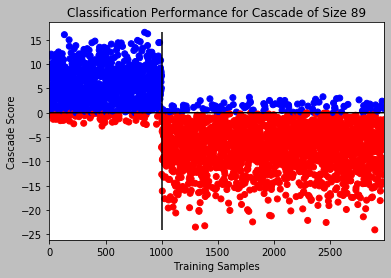

F_i: 0.061559286559286566
Cascade size: 89
 
Best feature index: 5916/7742


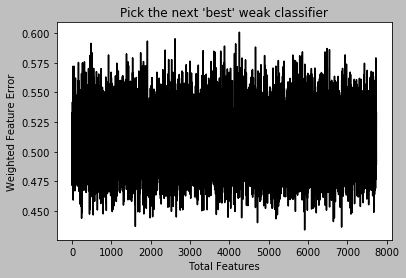

f_i: 0.4841705341705342
TP, TN, FP, FN for the current weak classifier:
0.5175175175175175 0.5141414141414141 0.4858585858585859 0.4824824824824825
Threshold: -1.9635635635635633
Classification error: 0.4847264182611615


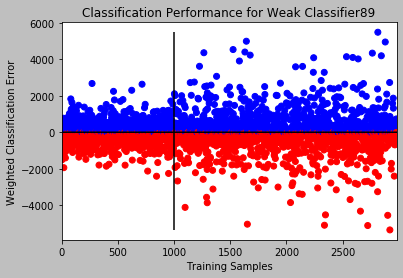

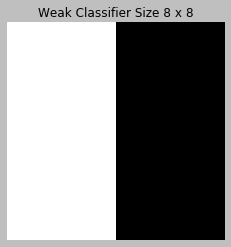

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


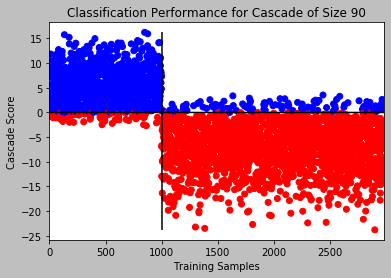

F_i: 0.05654063154063154
Cascade size: 90
 
Best feature index: 4313/7742


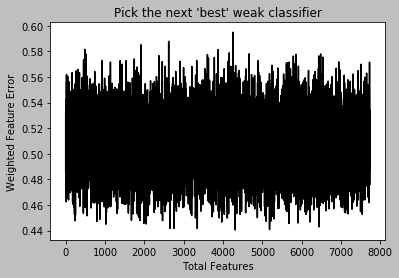

f_i: 0.29493129493129494
TP, TN, FP, FN for the current weak classifier:
0.6626626626626627 0.7474747474747475 0.25252525252525254 0.33733733733733734
Threshold: 120.05519383019383
Classification error: 0.2809667673716012


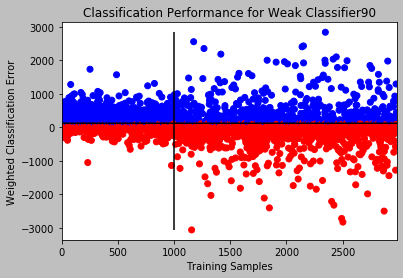

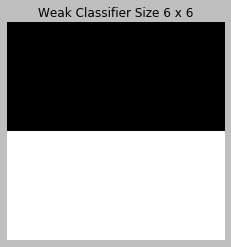

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


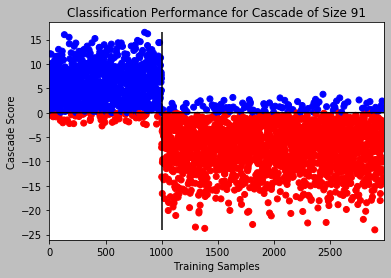

F_i: 0.06055828555828556
Cascade size: 91
 
Best feature index: 2652/7742


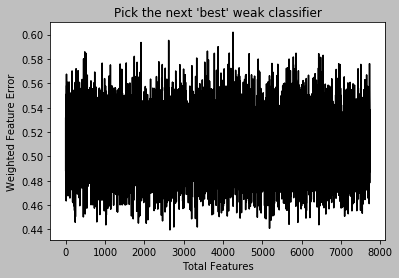

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars


f_i: 0.4234893984893985
TP, TN, FP, FN for the current weak classifier:
0.5565565565565566 0.5964646464646465 0.4035353535353535 0.44344344344344344
Threshold: 121.6356401856402
Classification error: 0.4169184290030212


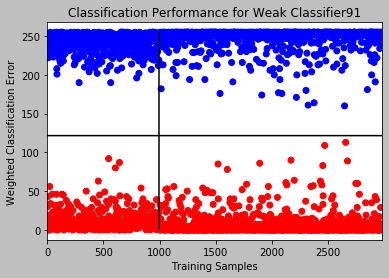

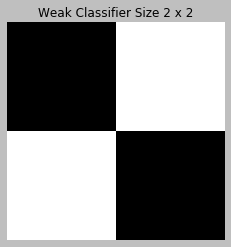

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


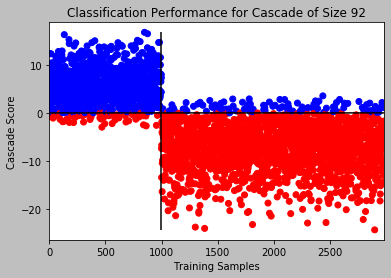

F_i: 0.060544635544635544
Cascade size: 92
 
Best feature index: 5185/7742


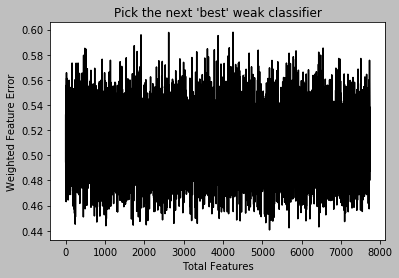

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


f_i: 0.47704295204295205
TP, TN, FP, FN for the current weak classifier:
0.4494494494494494 0.5964646464646465 0.4035353535353535 0.5505505505505506
Threshold: 109.35524843024842
Classification error: 0.45283652232292715


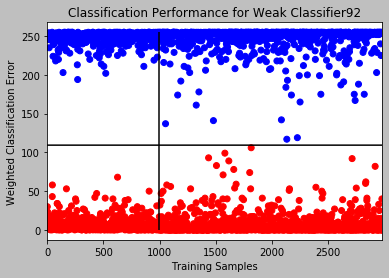

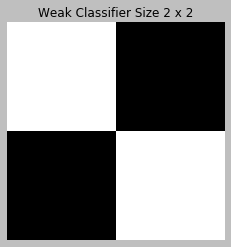

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


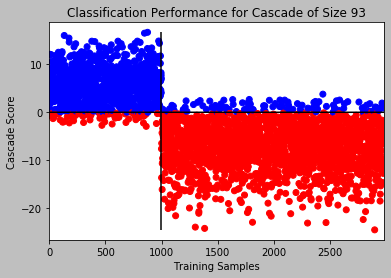

F_i: 0.05829010829010829
Cascade size: 93
 
Best feature index: 5681/7742


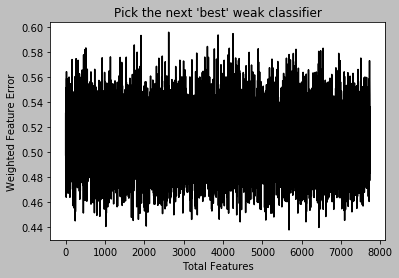

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


f_i: 0.450043225043225
TP, TN, FP, FN for the current weak classifier:
0.5095095095095095 0.5904040404040404 0.40959595959595957 0.4904904904904905
Threshold: 117.46069706069707
Classification error: 0.4367237327962403


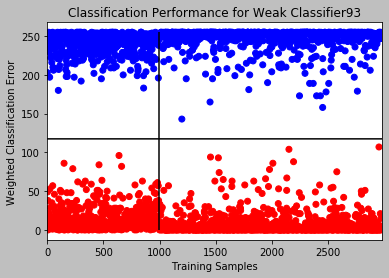

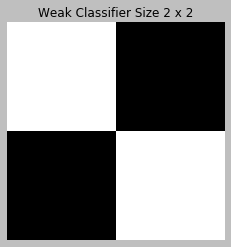

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


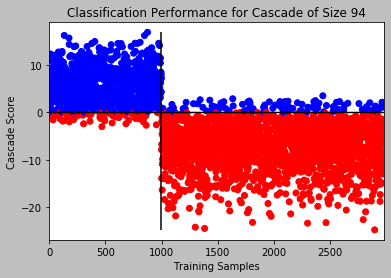

F_i: 0.05953908453908455
Cascade size: 94
 
Best feature index: 1023/7742


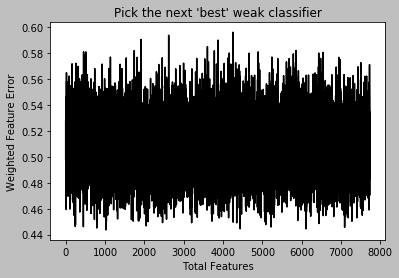

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars


f_i: 0.3621598871598871
TP, TN, FP, FN for the current weak classifier:
0.7307307307307307 0.544949494949495 0.45505050505050504 0.26926926926926925
Threshold: 147.16853444353444
Classification error: 0.39274924471299094


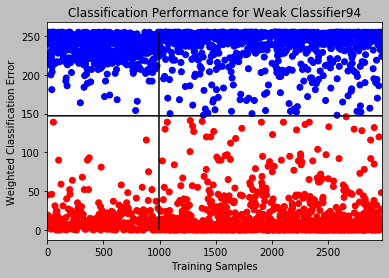

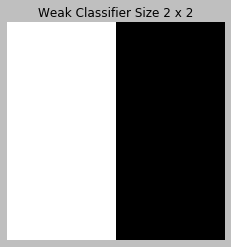

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


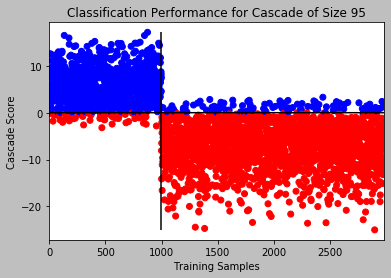

F_i: 0.0557967057967058
Cascade size: 95
 
Best feature index: 450/7742


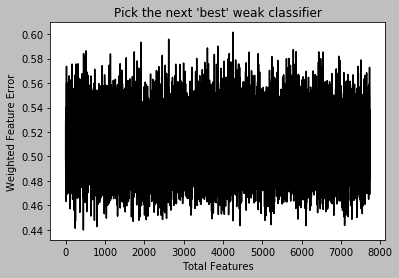

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


f_i: 0.4924674674674675
TP, TN, FP, FN for the current weak classifier:
0.3983983983983984 0.6166666666666667 0.38333333333333336 0.6016016016016016
Threshold: 101.70402447902447
Classification error: 0.45652903658945954


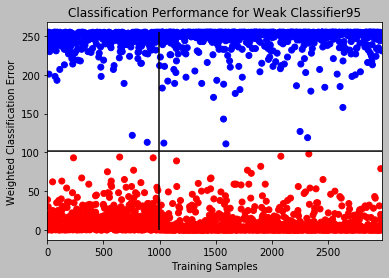

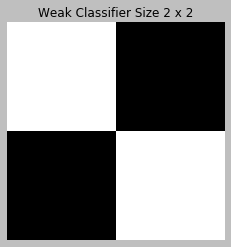

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


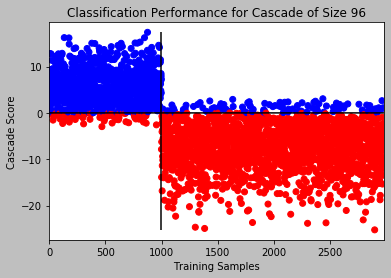

F_i: 0.057794157794157794
Cascade size: 96
 
Best feature index: 792/7742


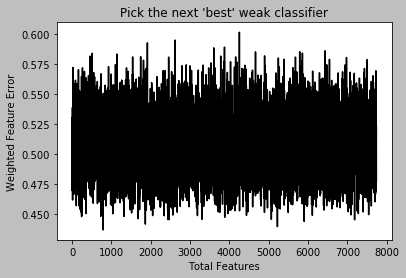

f_i: 0.36193011193011193
TP, TN, FP, FN for the current weak classifier:
0.6246246246246246 0.6515151515151515 0.3484848484848485 0.37537537537537535
Threshold: -284.60997815997814
Classification error: 0.35750251762336355


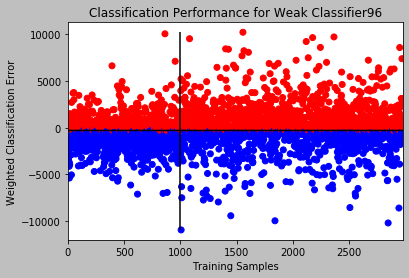

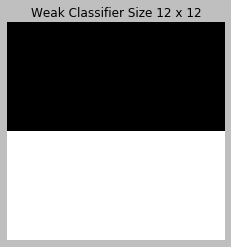

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


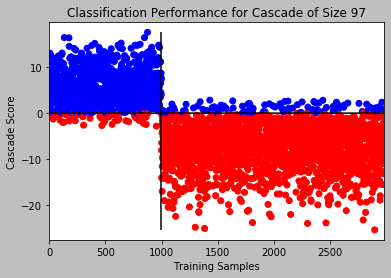

F_i: 0.054538629538629535
Cascade size: 97
 
Best feature index: 243/7742


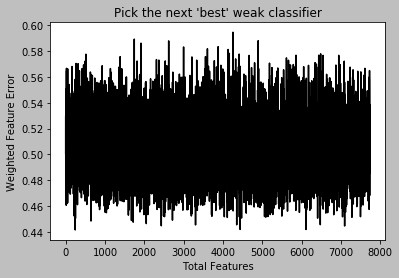

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars


f_i: 0.5014651014651015
TP, TN, FP, FN for the current weak classifier:
0.43343343343343343 0.5636363636363636 0.43636363636363634 0.5665665665665666
Threshold: 113.02300027300026
Classification error: 0.48002685464921113


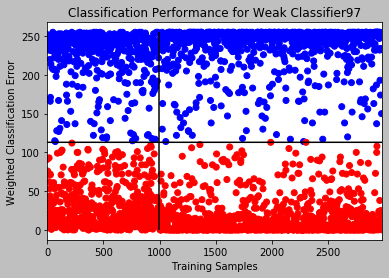

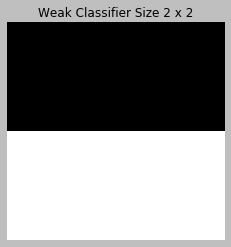

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


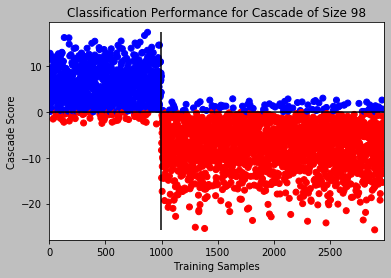

F_i: 0.05603558103558104
Cascade size: 98
 
Best feature index: 4350/7742


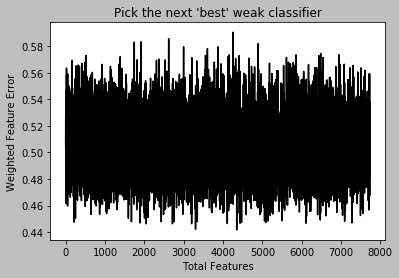

f_i: 0.2958367458367458
TP, TN, FP, FN for the current weak classifier:
0.6396396396396397 0.7686868686868686 0.2313131313131313 0.36036036036036034
Threshold: -52.98946446446447
Classification error: 0.2745887881839543


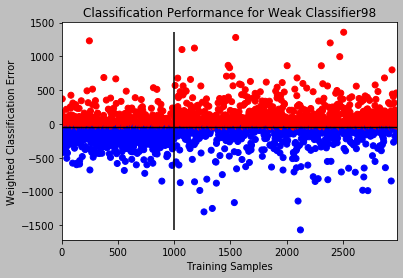

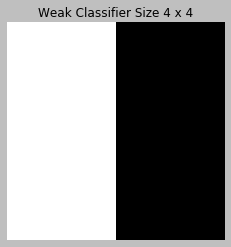

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


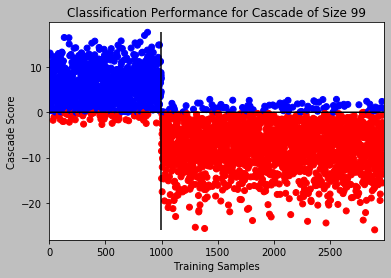

F_i: 0.05528710528710529
Cascade size: 99
 
Best feature index: 4437/7742


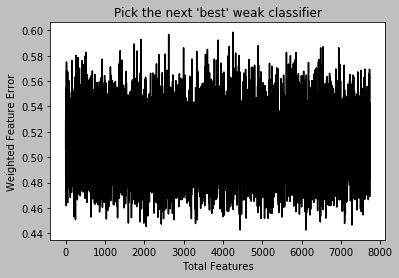

f_i: 0.43243470743470747
TP, TN, FP, FN for the current weak classifier:
0.5245245245245245 0.6106060606060606 0.3893939393939394 0.4754754754754755
Threshold: 3.8522249522249523
Classification error: 0.4182611614635784


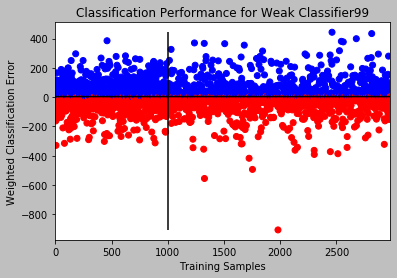

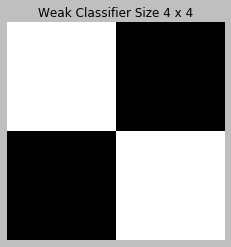

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


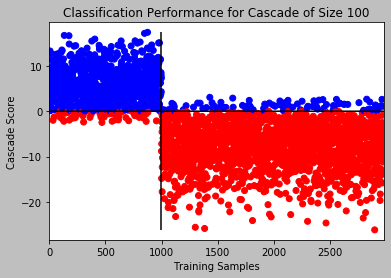

F_i: 0.05527345527345527
Cascade size: 100
 
Best feature index: 2050/7742


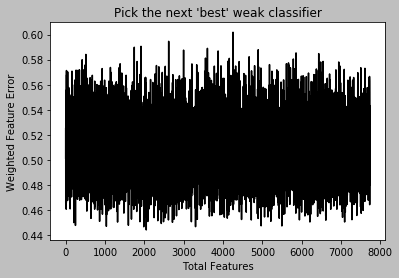

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars


f_i: 0.4268996268996269
TP, TN, FP, FN for the current weak classifier:
0.6956956956956957 0.4505050505050505 0.5494949494949495 0.30430430430430433
Threshold: 98.9664186914187
Classification error: 0.46727089627391744


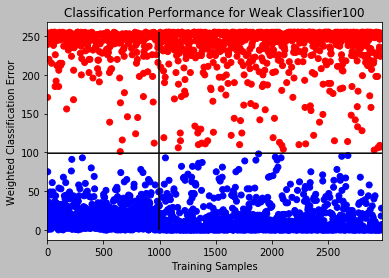

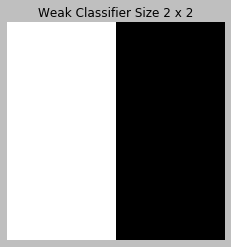

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


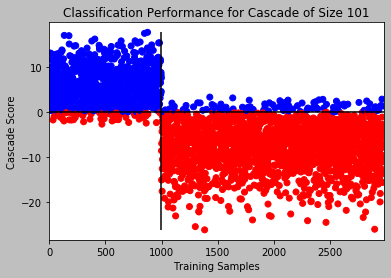

F_i: 0.05678405678405678
Cascade size: 101
 
Best feature index: 1320/7742


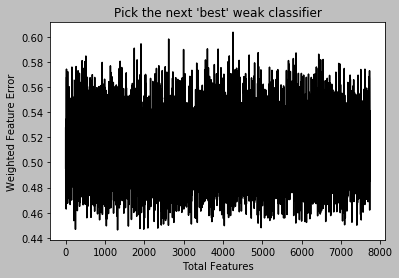

f_i: 0.46436891436891437
TP, TN, FP, FN for the current weak classifier:
0.4944944944944945 0.5767676767676768 0.42323232323232324 0.5055055055055055
Threshold: 22.564409864409864
Classification error: 0.4508224236320913


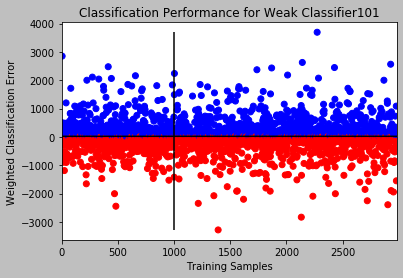

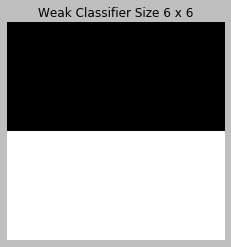

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


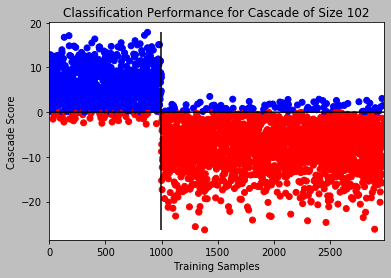

F_i: 0.054786604786604784
Cascade size: 102
 
Best feature index: 1986/7742


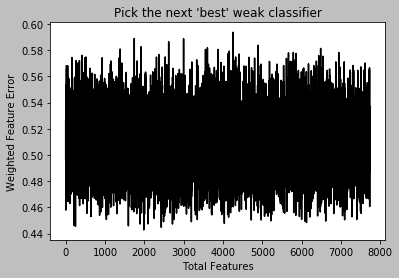

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars


f_i: 0.45151970151970156
TP, TN, FP, FN for the current weak classifier:
0.6676676676676677 0.4292929292929293 0.5707070707070707 0.33233233233233234
Threshold: 99.54619619619619
Classification error: 0.49076871433366903


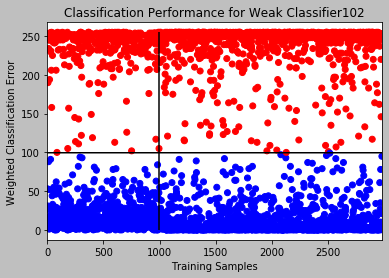

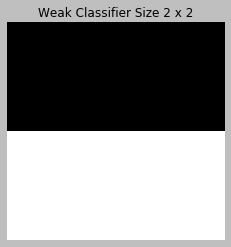

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


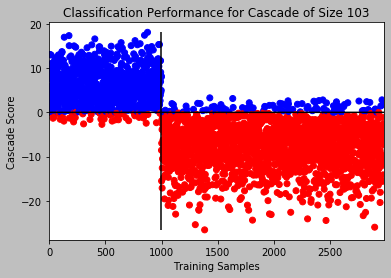

F_i: 0.05303712803712804
Cascade size: 103
 
Best feature index: 2090/7742


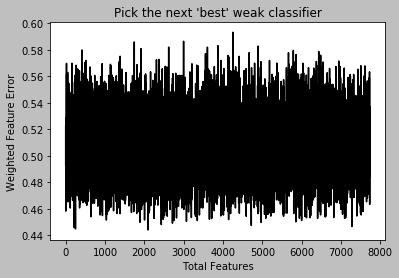

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars


f_i: 0.4371598871598872
TP, TN, FP, FN for the current weak classifier:
0.5085085085085085 0.6171717171717171 0.38282828282828285 0.4914914914914915
Threshold: 113.54417144417144
Classification error: 0.4192682108089963


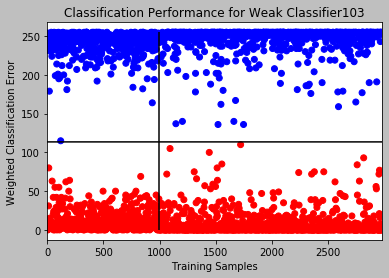

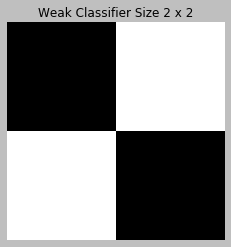

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


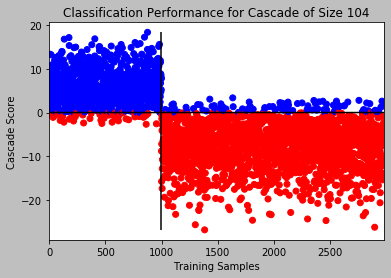

F_i: 0.051774501774501776
Cascade size: 104
 
Best feature index: 249/7742


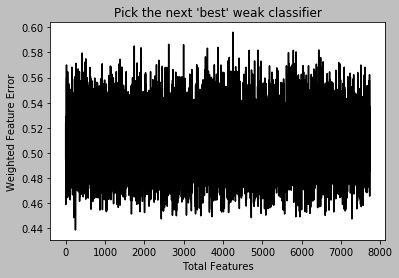

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


f_i: 0.4487942487942488
TP, TN, FP, FN for the current weak classifier:
0.5125125125125125 0.5898989898989899 0.4101010101010101 0.4874874874874875
Threshold: 117.64545682045681
Classification error: 0.43605236656596175


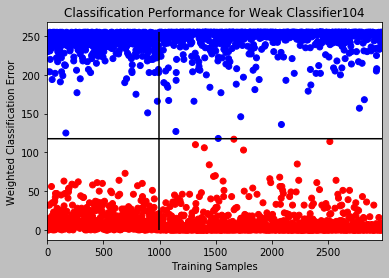

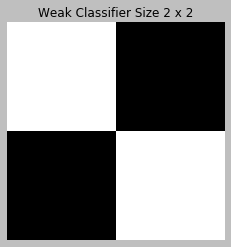

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


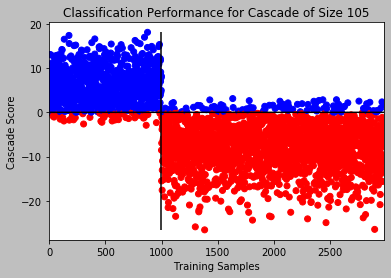

F_i: 0.05203157703157703
Cascade size: 105
 
Best feature index: 7281/7742


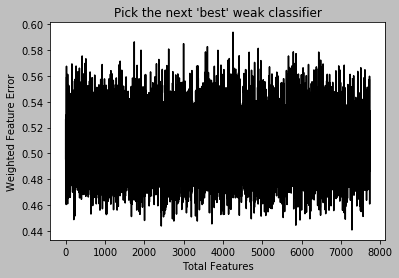

f_i: 0.33734416234416237
TP, TN, FP, FN for the current weak classifier:
0.6046046046046046 0.7207070707070707 0.2792929292929293 0.3953953953953954
Threshold: -73.66346118846118
Classification error: 0.31822759315206445


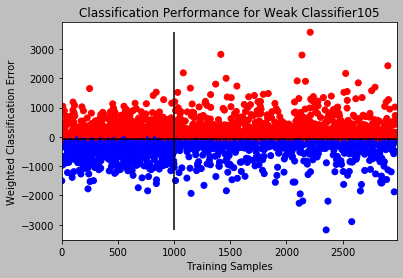

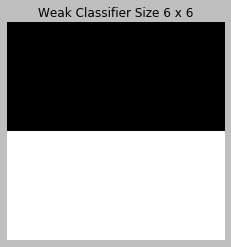

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


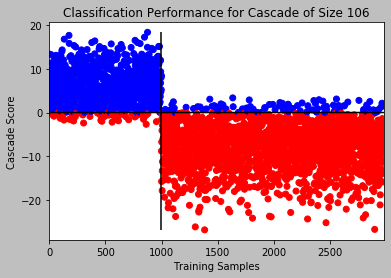

F_i: 0.051021476021476025
Cascade size: 106
 
Best feature index: 3719/7742


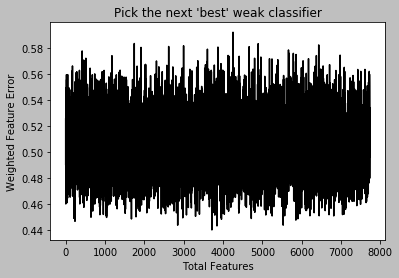

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


f_i: 0.46245563745563745
TP, TN, FP, FN for the current weak classifier:
0.4624624624624625 0.6126262626262626 0.38737373737373737 0.5375375375375375
Threshold: 109.27645827645827
Classification error: 0.4377307821416583


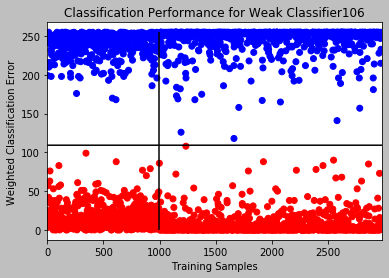

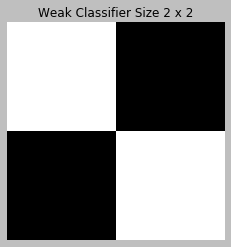

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


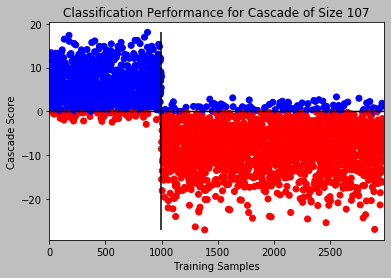

F_i: 0.05503458003458003
Cascade size: 107
 
Best feature index: 237/7742


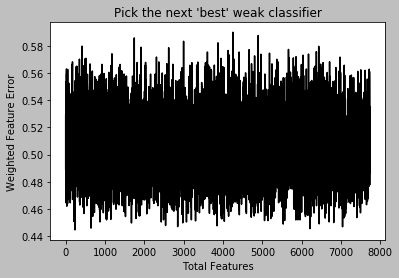

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars


f_i: 0.3497133497133497
TP, TN, FP, FN for the current weak classifier:
0.7147147147147147 0.5858585858585859 0.41414141414141414 0.2852852852852853
Threshold: 136.15887023387023
Classification error: 0.3709298422289359


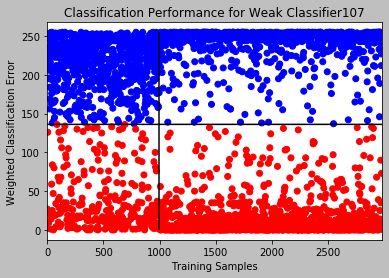

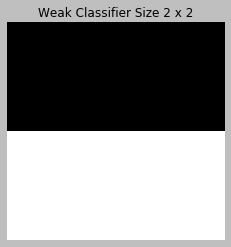

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


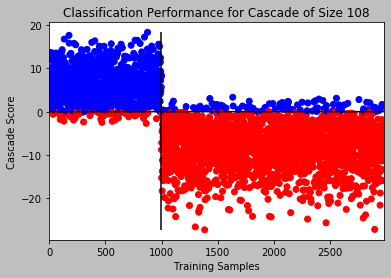

F_i: 0.05402447902447903
Cascade size: 108
 
Best feature index: 1035/7742


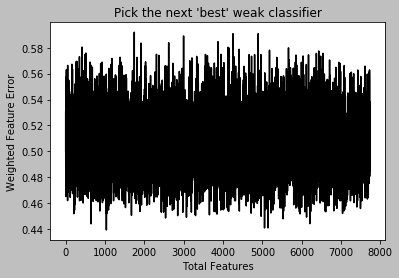

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


f_i: 0.4760601510601511
TP, TN, FP, FN for the current weak classifier:
0.45545545545545546 0.5924242424242424 0.4075757575757576 0.5445445445445446
Threshold: 111.45659295659296
Classification error: 0.4535078885532058


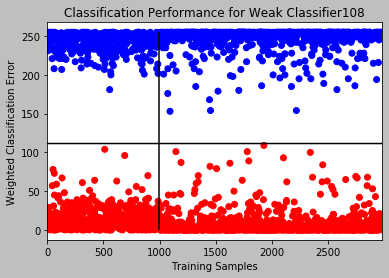

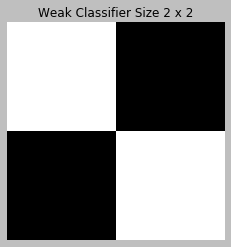

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


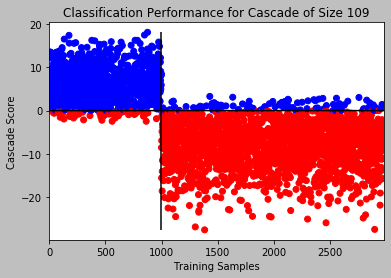

F_i: 0.05327600327600328
Cascade size: 109
 
Best feature index: 5058/7742


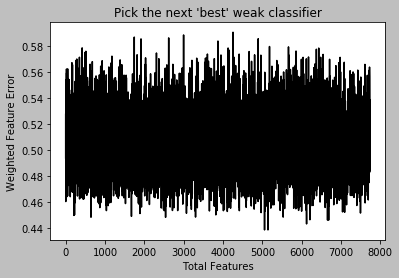

f_i: 0.4177427427427427
TP, TN, FP, FN for the current weak classifier:
0.5145145145145145 0.65 0.35 0.4854854854854855
Threshold: -19.50926380926381
Classification error: 0.39543470963410543


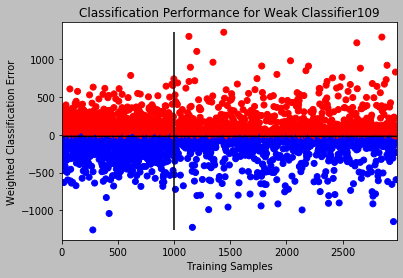

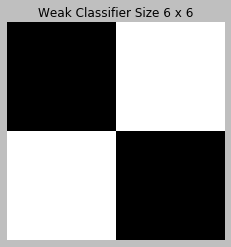

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


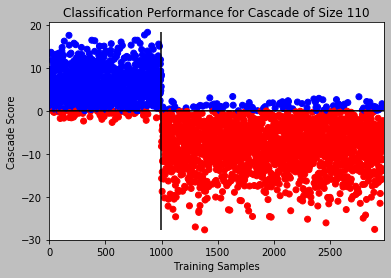

F_i: 0.05176995176995177
Cascade size: 110
 
Best feature index: 4721/7742


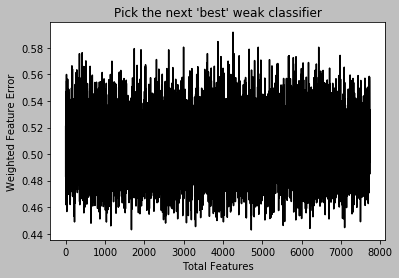

f_i: 0.3087678587678588
TP, TN, FP, FN for the current weak classifier:
0.5955955955955956 0.7868686868686868 0.21313131313131314 0.4044044044044044
Threshold: 60.0799868049868
Classification error: 0.2772742531050688


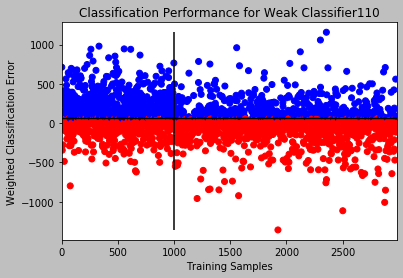

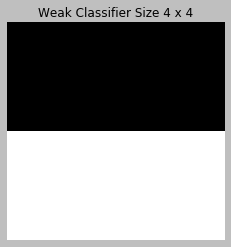

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


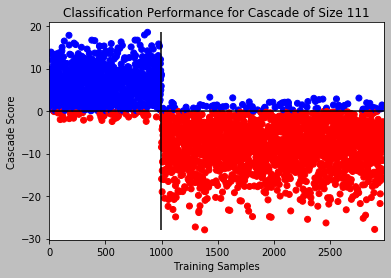

F_i: 0.05025935025935026
Cascade size: 111
 
Best feature index: 2541/7742


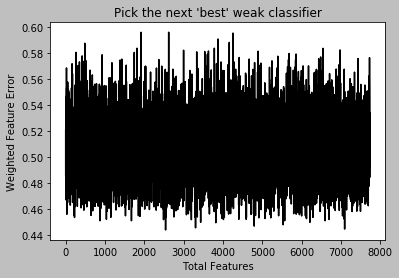

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars


f_i: 0.4765174265174265
TP, TN, FP, FN for the current weak classifier:
0.6116116116116116 0.4353535353535353 0.5646464646464646 0.3883883883883884
Threshold: 106.09636227136227
Classification error: 0.5055387713997986


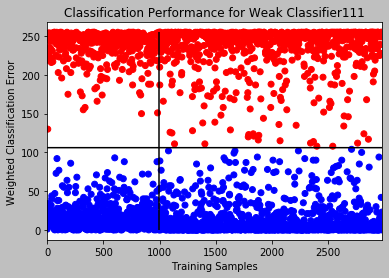

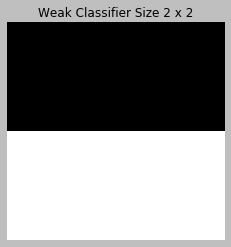

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars


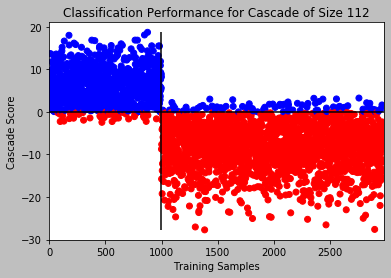

F_i: 0.04976339976339976
Cascade size: 112
--- 3042.9018716812134 seconds ---


In [8]:
# AdaBoost Algorithm and Cascade Creation

F_target = 0.05
f = 0.5

F_i = 1

cascade = []
start_time = time.time()

image_weights = [1.0 / (2 * training_set_pos)] * training_set_pos + [1.0 / (2 * training_set_neg)] * training_set_neg

# Iterate until F_target is reached
while F_i > F_target:

    index_next_feature = 0
    next_weak_classifier = 0
    lowest_error = float("inf")

    # initialize image weights
    total = sum(image_weights)
    image_weights = [w / total for w in image_weights]

    TP = 0
    TN = 0

    f_i = 1
    loop = 0

    while (TP / training_set_pos < 0.5) and (TN / training_set_neg < 0.5):
        total = sum(image_weights)
        if total != 1:
            image_weights = [w / total for w in image_weights]

        errors = []
        counter = 0
        inner_counter = 0

        # Get Weighted Error for each Feature. Find next best feature.
        for j in features:

            # Create object for each feature
            w_classif = WeakClassifier(j, thetas[counter], polarities[counter], 0)

            # Get predictions of all samples
            predicted = []
            for sample in range(len(training_set)):
                score = scores[inner_counter]
                predicted.append(predict(score, w_classif))
                inner_counter += 1

            # Calculate weighted error for each feature
            weighted_error = feature_weighted_error_rate(training_labels, predicted, image_weights)
            errors.append(weighted_error)

            # Select feature with lowest error as next classifier in cascade
            if weighted_error < lowest_error:
                lowest_error = weighted_error
                next_weak_classifier = w_classif
                index_next_feature = features.index(j)

            counter += 1

        print(" ")
        print("Best feature index: " + str(index_next_feature) + "/" + str(len(features)))

        plt.plot(errors)
        plt.ylabel("Weighted Feature Error")
        plt.xlabel("Total Features")
        plt.title("Pick the next 'best' weak classifier")
        plt.show()

        # Choose weak classifier with lowest error
        b_t = lowest_error / (1 - lowest_error)

        if b_t == 0:
            invert_weight = 0
        else:
            invert_weight = log(1 / b_t)
        next_weak_classifier.weight = invert_weight

        # Update weights and evaluate current weak classifier
        predicted = []
        scores_weighted = []
        for sample in range(len(training_set)):
            # Get weighted classification error
            score = get_haar_score_fast(next_weak_classifier.haar, training_set[sample], training_integrals[sample])
            scores_weighted.append(score)
            predicted.append(predict(score, next_weak_classifier))

        FP = 0.0
        FN = 0.0
        TP = 0.0
        TN = 0.0
        colors_predicted = []

        for k in range(len(image_weights)):
            # if sample is correctly classified

            if training_labels[k] == 1 and predicted[k] == -1:
                FN += 1
            if training_labels[k] == -1 and predicted[k] == 1:
                FP += 1

            # Update image weights
            if training_labels[k] == predicted[k]:
                image_weights[k] = image_weights[k] * b_t
                if predicted[k] == 1:
                    TP += 1
                if predicted[k] == -1:
                    TN += 1

            if predicted[k] == -1:
                colors_predicted.append('r')
            else:
                colors_predicted.append('b')

        # Evaluate f_i
        f_i = (FP / (2 * training_set_neg)) + (FN / (2 * training_set_pos))
        print("f_i: " + str(f_i))

        print("TP, TN, FP, FN for the current weak classifier:")
        print(TP / training_set_pos, TN / training_set_neg, FP / training_set_neg, FN / training_set_pos)

        print('Threshold: ' + str(next_weak_classifier.theta))
        print('Classification error: ' + str((FP + FN) / (TP + TN + FP + FN)))

        # Visualize the performance of weak classifier for training samples
        plt.scatter(range(training_set_pos + training_set_neg), scores_weighted, c=colors_predicted)
        plt.vlines(training_set_pos, min(scores_weighted), max(scores_weighted))
        plt.plot(range(training_set_pos + training_set_neg),
                 [next_weak_classifier.theta] * (training_set_pos + training_set_neg))
        plt.xlim(0, training_set_pos + training_set_neg)
        plt.ylabel("Weighted Classification Error")
        plt.xlabel("Training Samples")
        plt.title("Classification Performance for Weak Classifier " + str(len(cascade) + 1))
        plt.show()

        loop += 1

    cascade.append(next_weak_classifier)

    # Plot in matlib the haar features
    plot_haar(next_weak_classifier.haar.feature, "Weak Classifier Size " +
              str(next_weak_classifier.haar.shape[1] * next_weak_classifier.haar.size) +
              " x " + str(next_weak_classifier.haar.shape[0] * next_weak_classifier.haar.size))

    strong_FP = 0.0
    strong_FN = 0.0

    cascade_scores = []
    cascade_colors_predicted = []
    for l in range(len(training_set)):
        strong_score = 0.0
        for w_class in cascade:
            strong_score += w_class.weight * predict(
                get_haar_score_fast(w_class.haar, training_set[l], training_integrals[l]), w_class)
        cascade_scores.append(strong_score)
        classify = np.sign(strong_score)
        if classify == -1:
            cascade_colors_predicted.append('r')
        else:
            cascade_colors_predicted.append('b')

        if training_labels[l] == 1 and classify == -1:
            strong_FN += 1
        if training_labels[l] == -1 and classify == 1:
            strong_FP += 1

    # Visualize the performance of the cascade on training samples
    plt.scatter(range(training_set_pos + training_set_neg), cascade_scores, c=cascade_colors_predicted)
    plt.vlines(training_set_pos, min(cascade_scores), max(cascade_scores))
    plt.plot(range(training_set_pos + training_set_neg), [0] * (training_set_pos + training_set_neg))
    plt.xlim(0, training_set_pos + training_set_neg)
    plt.ylabel("Cascade Score")
    plt.xlabel("Training Samples")
    plt.title("Classification Performance for Cascade of Size " + str(len(cascade)))
    plt.show()

    F_i = (strong_FP / (2 * training_set_neg)) + (strong_FN / (2 * training_set_pos))
    print("F_i: " + str(F_i))
    print("Cascade size: " + str(len(cascade)))

print("--- %s seconds ---" % (time.time() - start_time))

In [9]:
# Run Strong Classifier on Testing Set

FP_test = 0.0
FN_test = 0.0
TP_test = 0.0
TN_test = 0.0

scores = []

for t in range(len(testing_set)):
    strong_score = 0.0
    for w_class in cascade:
        strong_score += w_class.weight * predict(get_haar_score_fast(w_class.haar, testing_set[t], testing_integrals[t]), w_class)
    classify = np.sign(strong_score)
    scores.append(strong_score)

    if testing_labels[t] == 1 and classify == -1:
        FN_test += 1
    if testing_labels[t] == -1 and classify == 1:
        FP_test += 1
    if testing_labels[t] == 1 and classify == 1:
        TP_test += 1
    if testing_labels[t] == -1 and classify == -1:
        TN_test += 1

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:90: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: RuntimeWarning: overflow encountered in ubyte_scalars


Result of Strong Classifier on Testing Set
Test F_i: 0.11975839475839475
False Positives for Testing: 19.0
False Negatives for Testing: 17.0


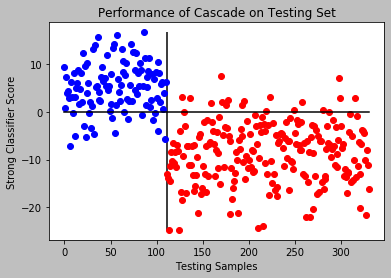

TP Rate: 0.8468468468468469
TN Rate: 0.9136363636363637
FP Rate: 0.08636363636363636
FN Rate: 0.15315315315315314


In [13]:
# Display Evaluation of Strong Classifier

print("Result of Strong Classifier on Testing Set")
print("Test F_i: " + str((FP_test / (2 * testing_set_neg)) + (FN_test / (2 * testing_set_pos))))
print("False Positives for Testing: " + str(FP_test))
print("False Negatives for Testing: " + str(FN_test))

plt.plot(range(testing_set_pos), scores[0:testing_set_pos], 'bo')
plt.vlines(testing_set_pos, min(scores), max(scores))
plt.plot(range(testing_set_pos, testing_set_pos + testing_set_neg), scores[testing_set_pos:], 'ro')
plt.plot(range(testing_set_pos + testing_set_neg), [0] * (testing_set_pos + testing_set_neg))
plt.ylabel("Strong Classifier Score")
plt.xlabel("Testing Samples")
plt.title("Performance of Cascade on Testing Set")
plt.show()

print("TP Rate: " + str(TP_test / testing_set_pos))
print("TN Rate: " + str(TN_test / testing_set_neg))
print("FP Rate: " + str(FP_test / testing_set_neg))
print("FN Rate: " + str(FN_test / testing_set_pos))

Number of strong scores / testing set size: 331
Maximum strong score: 16.739796943782665
Minimum strong score: -24.759078082489275
[0.0, 0.018018018018018018, 0.02702702702702703, 0.05405405405405406, 0.08108108108108109, 0.11711711711711711, 0.14414414414414414, 0.1891891891891892, 0.21621621621621623, 0.3063063063063063, 0.3783783783783784, 0.45045045045045046, 0.5405405405405406, 0.6126126126126126, 0.6576576576576577, 0.7567567567567568, 0.8198198198198198, 0.8468468468468469, 0.8918918918918919, 0.918918918918919, 0.918918918918919, 0.9369369369369369, 0.963963963963964, 0.990990990990991, 0.990990990990991, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.00909090909090909, 0.00909090909090909, 0.00909090909090909, 0.00909090909090909, 0.022727272727272728, 0.05, 0.06363636363636363, 0.08636363636363636, 0.10454545454545454, 0.1318181818181818, 0.19545454545454546, 0.23636363636363636, 0.3045

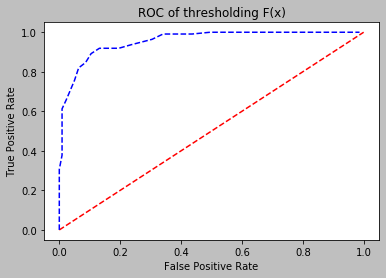

In [14]:
# Plotting ROC Graph

FPR = []
TPR = []

print('Number of strong scores / testing set size: ' + str(len(scores)))
print('Maximum strong score: ' + str(max(scores)))
print('Minimum strong score: ' + str(min(scores)))
for n in np.arange(-round(max(scores)),-round(min(scores)),1):

  FP_test = 0.0
  FN_test = 0.0
  TP_test = 0.0
  TN_test = 0.0

  for t in range(len(scores)):
    classify = np.sign(scores[t]+n)
    if testing_labels[t] == 1 and classify == -1:
        FN_test += 1
    if testing_labels[t] == -1 and classify == 1:
        FP_test += 1
    if testing_labels[t] == 1 and classify == 1:
        TP_test += 1
    if testing_labels[t] == -1 and classify == -1:
        TN_test += 1

  TPR.append(TP_test/(TP_test + FN_test))
  FPR.append(FP_test/(FP_test + TN_test)) 

print(TPR)
print(FPR)

plt.plot([0,1], 'r--', FPR, TPR, 'b--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC of thresholding F(x)')
plt.show()